<h2>   
      <font color = blue >
            <span style='font-family:Georgia'>
            Real Time Stock Analysis using Machine Learning
            </span>   
        </font>    
</h2>

<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Importing Necessary Libraries
            </span>   
        </font>    
</h3>

In [1]:
import numpy as np
import pandas as pd

from pandas_datareader import data as wb
import yfinance as yf

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import plotly.graph_objs as go
import seaborn as sn

import statsmodels
import math
import random

from pyclustering.cluster.kmeans import kmeans
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from pyclustering.utils.metric import distance_metric
from pyclustering.utils.metric import type_metric
from pyclustering.utils import calculate_distance_matrix
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.samples.definitions import FCPS_SAMPLES
from pyclustering.utils import read_sample
%matplotlib inline

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn import datasets
from scipy import stats
from matplotlib.colors import ListedColormap
sn.set()

from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Extracting Data from Yahoo Finance
            </span>   
        </font>    
</h3>

In [2]:
b_tickers = ['SBIN.NS', 'HDB', 'AXISBANK.NS', 'CANBK.NS']
bank_sec_data = pd.DataFrame()

# Download data for each ticker
for t in b_tickers:
    data = yf.download(t, start='2018-09-01',end='2023-08-31', progress=False)
    data['Company Tick'] = t  # Create a 'Company' column with the ticker symbol
    bank_sec_data = bank_sec_data.append(data)

# Reset the index and rename the index column to 'Date'
bank_sec_data.reset_index(inplace=True)
bank_sec_data.rename(columns={'Date': 'Date'}, inplace=True)

# Create a new column 'Industry' with the value 'Banking'
bank_sec_data['Industry'] = 'Banking'

# Reorder columns to have 'Industry' as the first column
bank_sec_data = bank_sec_data[['Industry', 'Date', 'Company Tick', 'Open','High','Low','Adj Close', 'Volume']]

# Display the DataFrame
bank_sec_data

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume
0,Banking,2018-09-03,SBIN.NS,312.500000,312.500000,304.799988,293.185760,14708076
1,Banking,2018-09-04,SBIN.NS,306.799988,307.450012,295.450012,283.663300,42859084
2,Banking,2018-09-05,SBIN.NS,296.500000,298.850006,290.399994,283.806854,22922686
3,Banking,2018-09-06,SBIN.NS,298.000000,299.850006,294.500000,283.711182,18001336
4,Banking,2018-09-07,SBIN.NS,295.899994,295.899994,289.450012,279.117401,23716678
...,...,...,...,...,...,...,...,...
4950,Banking,2023-08-24,CANBK.NS,334.899994,337.500000,330.700012,331.799988,6073830
4951,Banking,2023-08-25,CANBK.NS,330.500000,332.350006,325.000000,325.600006,6112706
4952,Banking,2023-08-28,CANBK.NS,327.250000,328.700012,325.549988,326.649994,3003980
4953,Banking,2023-08-29,CANBK.NS,328.399994,329.350006,325.500000,326.600006,3152872


In [3]:
c_tickers = ['TATACHEM.NS','GRAUWEIL.NS','TIRUMALCHM.NS','BALAMINES.NS']
chemical_sec_data = pd.DataFrame()

# Download data for each ticker
for t in c_tickers:
    data = yf.download(t, start='2018-09-01',end='2023-08-31', progress=False)
    data['Company Tick'] = t  # Create a 'Company' column with the ticker symbol
    chemical_sec_data = chemical_sec_data.append(data)

# Reset the index and rename the index column to 'Date'
chemical_sec_data.reset_index(inplace=True)
chemical_sec_data.rename(columns={'Date': 'Date'}, inplace=True)

# Create a new column 'Industry' with the value 'Banking'
chemical_sec_data['Industry'] = 'Chemical'

# Reorder columns to have 'Industry' as the first column
chemical_sec_data = chemical_sec_data[['Industry', 'Date', 'Company Tick', 'Open','High','Low', 'Adj Close', 'Volume']]

# Display the DataFrame
chemical_sec_data

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume
0,Chemical,2018-09-03,TATACHEM.NS,760.000000,782.000000,756.000000,675.455017,1081754
1,Chemical,2018-09-04,TATACHEM.NS,765.000000,765.000000,744.349976,658.567627,972580
2,Chemical,2018-09-05,TATACHEM.NS,741.200012,748.950012,733.950012,651.663025,771705
3,Chemical,2018-09-06,TATACHEM.NS,743.000000,758.900024,738.000000,654.301697,589823
4,Chemical,2018-09-07,TATACHEM.NS,743.000000,764.849976,739.000000,668.990234,669449
...,...,...,...,...,...,...,...,...
4207,Chemical,2023-08-24,BALAMINES.NS,2090.000000,2126.100098,2086.649902,2116.000000,54053
4208,Chemical,2023-08-25,BALAMINES.NS,2125.000000,2139.000000,2095.000000,2127.300049,39690
4209,Chemical,2023-08-28,BALAMINES.NS,2141.949951,2152.000000,2113.850098,2145.699951,37911
4210,Chemical,2023-08-29,BALAMINES.NS,2156.000000,2323.750000,2146.050049,2291.399902,407377


In [4]:
f_tickers = ['HINDUNILVR.NS','MARICO.NS','DABUR.NS','GODREJCP.NS']
fmcg_sec_data = pd.DataFrame()

# Download data for each ticker
for t in f_tickers:
    data = yf.download(t, start='2018-09-01',end='2023-08-31', progress=False)
    data['Company Tick'] = t  # Create a 'Company' column with the ticker symbol
    fmcg_sec_data = fmcg_sec_data.append(data)

# Reset the index and rename the index column to 'Date'
fmcg_sec_data.reset_index(inplace=True)
fmcg_sec_data.rename(columns={'Date': 'Date'}, inplace=True)

# Create a new column 'Industry' with the value 'Banking'
fmcg_sec_data['Industry'] = 'FMCG'

# Reorder columns to have 'Industry' as the first column
fmcg_sec_data = fmcg_sec_data[['Industry', 'Date', 'Company Tick','Open','High','Low', 'Adj Close', 'Volume']]

# Display the DataFrame
fmcg_sec_data

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume
0,FMCG,2018-09-03,HINDUNILVR.NS,1791.500000,1791.500000,1695.849976,1566.216309,1744229
1,FMCG,2018-09-04,HINDUNILVR.NS,1697.000000,1697.949951,1623.849976,1522.062500,3852609
2,FMCG,2018-09-05,HINDUNILVR.NS,1643.000000,1647.550049,1596.000000,1485.651611,2693195
3,FMCG,2018-09-06,HINDUNILVR.NS,1623.449951,1636.500000,1598.650024,1482.794189,2008264
4,FMCG,2018-09-07,HINDUNILVR.NS,1611.900024,1644.699951,1601.000000,1510.586182,1571003
...,...,...,...,...,...,...,...,...
4927,FMCG,2023-08-24,GODREJCP.NS,1027.650024,1048.000000,1025.849976,1041.800049,849525
4928,FMCG,2023-08-25,GODREJCP.NS,1040.000000,1040.750000,1027.250000,1030.349976,262243
4929,FMCG,2023-08-28,GODREJCP.NS,1032.900024,1034.750000,1018.250000,1028.099976,323454
4930,FMCG,2023-08-29,GODREJCP.NS,1033.000000,1033.000000,1006.650024,1013.349976,635507


In [5]:
h_tickers = ['CIPLA.NS','BIOCON.NS','LALPATHLAB.NS','THYROCARE.NS']
health_sec_data = pd.DataFrame()

# Download data for each ticker
for t in h_tickers:
    data = yf.download(t, start='2018-09-01',end='2023-08-31', progress=False)
    data['Company Tick'] = t  # Create a 'Company' column with the ticker symbol
    health_sec_data = health_sec_data.append(data)

# Reset the index and rename the index column to 'Date'
health_sec_data.reset_index(inplace=True)
health_sec_data.rename(columns={'Date': 'Date'}, inplace=True)

# Create a new column 'Industry' with the value 'Banking'
health_sec_data['Industry'] = 'Health Care'

# Reorder columns to have 'Industry' as the first column
health_sec_data = health_sec_data[['Industry', 'Date', 'Company Tick','Open','High','Low', 'Adj Close', 'Volume']]

# Display the DataFrame
health_sec_data

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume
0,Health Care,2018-09-03,CIPLA.NS,665.500000,671.200012,646.599976,626.745789,1971733
1,Health Care,2018-09-04,CIPLA.NS,649.799988,655.000000,638.400024,621.724854,2249087
2,Health Care,2018-09-05,CIPLA.NS,645.049988,650.900024,637.200012,624.283630,2542543
3,Health Care,2018-09-06,CIPLA.NS,651.000000,664.700012,647.000000,639.298035,2841096
4,Health Care,2018-09-07,CIPLA.NS,663.849976,669.500000,656.299988,641.856812,2431363
...,...,...,...,...,...,...,...,...
4927,Health Care,2023-08-24,THYROCARE.NS,558.700012,560.000000,543.750000,545.400024,23121
4928,Health Care,2023-08-25,THYROCARE.NS,546.049988,560.750000,534.000000,536.150024,56866
4929,Health Care,2023-08-28,THYROCARE.NS,538.000000,540.950012,537.950012,538.950012,11409
4930,Health Care,2023-08-29,THYROCARE.NS,540.000000,554.700012,540.000000,552.599976,42719


In [6]:
t_tickers = ['HFCL.NS','BHARTIARTL.NS','IDEA.NS','TATACOMM.NS']
telcomm_sec_data = pd.DataFrame()

# Download data for each ticker
for t in t_tickers:
    data = yf.download(t, start='2018-09-01',end='2023-08-31', progress=False)
    data['Company Tick'] = t  # Create a 'Company' column with the ticker symbol
    telcomm_sec_data = telcomm_sec_data.append(data)

# Reset the index and rename the index column to 'Date'
telcomm_sec_data.reset_index(inplace=True)
telcomm_sec_data.rename(columns={'Date': 'Date'}, inplace=True)

# Create a new column 'Industry' with the value 'Banking'
telcomm_sec_data['Industry'] = 'Tele Communication'

# Reorder columns to have 'Industry' as the first column
telcomm_sec_data = telcomm_sec_data[['Industry', 'Date', 'Company Tick','Open','High','Low', 'Adj Close', 'Volume']]

# Display the DataFrame
telcomm_sec_data

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume
0,Tele Communication,2018-09-03,HFCL.NS,25.900000,26.400000,25.450001,25.221001,8087226
1,Tele Communication,2018-09-04,HFCL.NS,25.700001,25.950001,24.450001,24.186544,5378857
2,Tele Communication,2018-09-05,HFCL.NS,24.500000,24.799999,24.100000,24.235806,5471956
3,Tele Communication,2018-09-06,HFCL.NS,24.799999,25.299999,24.549999,24.728403,3723349
4,Tele Communication,2018-09-07,HFCL.NS,25.150000,25.200001,24.650000,24.482103,3105279
...,...,...,...,...,...,...,...,...
4927,Tele Communication,2023-08-24,TATACOMM.NS,1828.650024,1857.949951,1801.250000,1829.699951,1437663
4928,Tele Communication,2023-08-25,TATACOMM.NS,1823.050049,1848.000000,1804.400024,1817.250000,963518
4929,Tele Communication,2023-08-28,TATACOMM.NS,1820.400024,1822.000000,1790.050049,1797.750000,800777
4930,Tele Communication,2023-08-29,TATACOMM.NS,1798.000000,1805.000000,1781.650024,1788.099976,522338


In [7]:
g_tickers = ['ADANIGREEN.NS','GREENPOWER.NS','SWSOLAR.NS','GEPIL.NS']
green_sec_data = pd.DataFrame()

# Download data for each ticker
for t in g_tickers:
    data = yf.download(t, start='2018-09-01',end='2023-08-31', progress=False)
    data['Company Tick'] = t  # Create a 'Company' column with the ticker symbol
    green_sec_data = green_sec_data.append(data)

# Reset the index and rename the index column to 'Date'
green_sec_data.reset_index(inplace=True)
green_sec_data.rename(columns={'Date': 'Date'}, inplace=True)

# Create a new column 'Industry' with the value 'Banking'
green_sec_data['Industry'] = 'Green Energy'

# Reorder columns to have 'Industry' as the first column
green_sec_data = green_sec_data[['Industry', 'Date', 'Company Tick','Open','High','Low', 'Adj Close', 'Volume']]

# Display the DataFrame
green_sec_data

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume
0,Green Energy,2018-09-03,ADANIGREEN.NS,57.799999,58.599998,55.700001,55.900002,444735
1,Green Energy,2018-09-04,ADANIGREEN.NS,56.799999,56.799999,53.250000,53.500000,528265
2,Green Energy,2018-09-05,ADANIGREEN.NS,53.500000,54.500000,51.000000,52.250000,476641
3,Green Energy,2018-09-06,ADANIGREEN.NS,53.250000,54.849998,52.450001,54.849998,773528
4,Green Energy,2018-09-07,ADANIGREEN.NS,56.000000,57.450001,55.000000,55.700001,470728
...,...,...,...,...,...,...,...,...
4694,Green Energy,2023-08-24,GEPIL.NS,164.350006,166.899994,161.600006,163.350006,324232
4695,Green Energy,2023-08-25,GEPIL.NS,164.449997,168.600006,160.649994,162.199997,491168
4696,Green Energy,2023-08-28,GEPIL.NS,164.699997,165.350006,162.550003,163.949997,124076
4697,Green Energy,2023-08-29,GEPIL.NS,164.699997,165.949997,162.899994,165.050003,225713


In [8]:
# List of dataframes
dataframes = [bank_sec_data, chemical_sec_data, fmcg_sec_data, health_sec_data, telcomm_sec_data, green_sec_data]

# Combine dataframes vertically using concat
sec_data = pd.concat(dataframes, ignore_index=True)
sec_data

# sec_data.to_csv('C:/Users/chowd/Downloads/Data Science and Machine Learning/Term Project/sec_data.csv', index=False)

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume
0,Banking,2018-09-03,SBIN.NS,312.500000,312.500000,304.799988,293.185760,14708076
1,Banking,2018-09-04,SBIN.NS,306.799988,307.450012,295.450012,283.663300,42859084
2,Banking,2018-09-05,SBIN.NS,296.500000,298.850006,290.399994,283.806854,22922686
3,Banking,2018-09-06,SBIN.NS,298.000000,299.850006,294.500000,283.711182,18001336
4,Banking,2018-09-07,SBIN.NS,295.899994,295.899994,289.450012,279.117401,23716678
...,...,...,...,...,...,...,...,...
28657,Green Energy,2023-08-24,GEPIL.NS,164.350006,166.899994,161.600006,163.350006,324232
28658,Green Energy,2023-08-25,GEPIL.NS,164.449997,168.600006,160.649994,162.199997,491168
28659,Green Energy,2023-08-28,GEPIL.NS,164.699997,165.350006,162.550003,163.949997,124076
28660,Green Energy,2023-08-29,GEPIL.NS,164.699997,165.949997,162.899994,165.050003,225713


In [9]:
sec_data['Adj_Close_Log_Returns'] = sec_data.groupby('Company Tick')['Adj Close'].apply(lambda x: np.log(x / x.shift(1)))
sec_data1 = sec_data.copy()
sec_data

,Industry,Date,Company Tick,Open,High,Low,Adj Close,Volume,Adj_Close_Log_Returns
0,Banking,2018-09-03,SBIN.NS,312.500000,312.500000,304.799988,293.185760,14708076,NaN
1,Banking,2018-09-04,SBIN.NS,306.799988,307.450012,295.450012,283.663300,42859084,-0.033018
2,Banking,2018-09-05,SBIN.NS,296.500000,298.850006,290.399994,283.806854,22922686,0.000506
3,Banking,2018-09-06,SBIN.NS,298.000000,299.850006,294.500000,283.711182,18001336,-0.000337
4,Banking,2018-09-07,SBIN.NS,295.899994,295.899994,289.450012,279.117401,23716678,-0.016324
...,...,...,...,...,...,...,...,...,...
28657,Green Energy,2023-08-24,GEPIL.NS,164.350006,166.899994,161.600006,163.350006,324232,0.005217
28658,Green Energy,2023-08-25,GEPIL.NS,164.449997,168.600006,160.649994,162.199997,491168,-0.007065
28659,Green Energy,2023-08-28,GEPIL.NS,164.699997,165.350006,162.550003,163.949997,124076,0.010731
28660,Green Energy,2023-08-29,GEPIL.NS,164.699997,165.949997,162.899994,165.050003,225713,0.006687


In [10]:
time_sec_data = sec_data.set_index('Date').copy()
time_sec_data

,Industry,Company Tick,Open,High,Low,Adj Close,Volume,Adj_Close_Log_Returns
Date,,,,,,,,
2018-09-03,Banking,SBIN.NS,312.500000,312.500000,304.799988,293.185760,14708076,NaN
2018-09-04,Banking,SBIN.NS,306.799988,307.450012,295.450012,283.663300,42859084,-0.033018
2018-09-05,Banking,SBIN.NS,296.500000,298.850006,290.399994,283.806854,22922686,0.000506
2018-09-06,Banking,SBIN.NS,298.000000,299.850006,294.500000,283.711182,18001336,-0.000337
2018-09-07,Banking,SBIN.NS,295.899994,295.899994,289.450012,279.117401,23716678,-0.016324
...,...,...,...,...,...,...,...,...
2023-08-24,Green Energy,GEPIL.NS,164.350006,166.899994,161.600006,163.350006,324232,0.005217
2023-08-25,Green Energy,GEPIL.NS,164.449997,168.600006,160.649994,162.199997,491168,-0.007065
2023-08-28,Green Energy,GEPIL.NS,164.699997,165.350006,162.550003,163.949997,124076,0.010731


<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Visualizing Stock Performance using Candle-Stick Plot
            </span>   
        </font>    
</h3>

In [11]:
# Create a candlestick plot for each company
company_figures = []

# Get unique companies
unique_companies = sec_data['Company Tick'].unique()

for company in unique_companies:
    company_data = sec_data[sec_data['Company Tick'] == company]
    
    trace = go.Candlestick(
        x=company_data['Date'],
        open=company_data['Open'],
        high=company_data['High'],
        low=company_data['Low'],
        close=company_data['Adj Close'],
        name=company
    )
    
    layout = go.Layout(
        title=f'Candlestick Chart for {company}',
        xaxis=dict(title='Date'),
        yaxis=dict(title='Price'),
        template='plotly_dark'  # You can choose a different template if you prefer
    )
    
    fig = go.Figure(data=[trace], layout=layout)
    company_figures.append(fig)

# Display each candlestick plot
for fig in company_figures:
    fig.show()


<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Data Preparation
            </span>   
        </font>    
</h3>

In [12]:
columns = list(sec_data.columns) 
print(columns)
print("")

['Industry', 'Date', 'Company Tick', 'Open', 'High', 'Low', 'Adj Close', 'Volume', 'Adj_Close_Log_Returns']



In [13]:
sec_data = sec_data.drop(['Date','Adj_Close_Log_Returns'],axis=1)
print("#Rows and #Columns",sec_data.shape)
print("")
columns = list(sec_data.columns) 
print(columns)

#Rows and #Columns (28662, 7)

['Industry', 'Company Tick', 'Open', 'High', 'Low', 'Adj Close', 'Volume']


In [14]:
dummy      = ['Industry','Company Tick']
dummydata  = pd.get_dummies(sec_data, columns=dummy)
dummydata.head()

#Columns
print("#Rows and #Columns",dummydata.shape)
print("")
columns = list(dummydata.columns) 
print(columns)

#Rows and #Columns (28662, 35)

['Open', 'High', 'Low', 'Adj Close', 'Volume', 'Industry_Banking', 'Industry_Chemical', 'Industry_FMCG', 'Industry_Green Energy', 'Industry_Health Care', 'Industry_Tele Communication', 'Company Tick_ADANIGREEN.NS', 'Company Tick_AXISBANK.NS', 'Company Tick_BALAMINES.NS', 'Company Tick_BHARTIARTL.NS', 'Company Tick_BIOCON.NS', 'Company Tick_CANBK.NS', 'Company Tick_CIPLA.NS', 'Company Tick_DABUR.NS', 'Company Tick_GEPIL.NS', 'Company Tick_GODREJCP.NS', 'Company Tick_GRAUWEIL.NS', 'Company Tick_GREENPOWER.NS', 'Company Tick_HDB', 'Company Tick_HFCL.NS', 'Company Tick_HINDUNILVR.NS', 'Company Tick_IDEA.NS', 'Company Tick_LALPATHLAB.NS', 'Company Tick_MARICO.NS', 'Company Tick_SBIN.NS', 'Company Tick_SWSOLAR.NS', 'Company Tick_TATACHEM.NS', 'Company Tick_TATACOMM.NS', 'Company Tick_THYROCARE.NS', 'Company Tick_TIRUMALCHM.NS']


In [15]:
dummydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28662 entries, 0 to 28661
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Open                         28662 non-null  float64
 1   High                         28662 non-null  float64
 2   Low                          28662 non-null  float64
 3   Adj Close                    28662 non-null  float64
 4   Volume                       28662 non-null  int64  
 5   Industry_Banking             28662 non-null  uint8  
 6   Industry_Chemical            28662 non-null  uint8  
 7   Industry_FMCG                28662 non-null  uint8  
 8   Industry_Green Energy        28662 non-null  uint8  
 9   Industry_Health Care         28662 non-null  uint8  
 10  Industry_Tele Communication  28662 non-null  uint8  
 11  Company Tick_ADANIGREEN.NS   28662 non-null  uint8  
 12  Company Tick_AXISBANK.NS     28662 non-null  uint8  
 13  Company Tick_BAL

In [16]:
# Normalize Non-Categorical Values
scaler = StandardScaler()
num_var = ['Open', 'High', 'Low', 'Adj Close', 'Volume']
sample_n = scaler.fit_transform(dummydata[num_var])
sample_n = sample_n.round(2)
sample_n = sample_n.tolist()
print(type(sample_n))
print(sample_n)

<class 'list'>
[[-0.46, -0.47, -0.47, -0.48, 0.02], [-0.47, -0.48, -0.48, -0.49, 0.5], [-0.49, -0.49, -0.49, -0.49, 0.16], [-0.48, -0.49, -0.48, -0.49, 0.08], [-0.49, -0.49, -0.49, -0.5, 0.17], [-0.49, -0.5, -0.5, -0.51, 0.17], [-0.5, -0.5, -0.5, -0.51, 0.25], [-0.5, -0.51, -0.5, -0.51, 0.16], [-0.5, -0.5, -0.49, -0.5, 0.03], [-0.5, -0.5, -0.5, -0.51, 0.05], [-0.5, -0.51, -0.51, -0.52, 0.35], [-0.52, -0.51, -0.52, -0.53, 0.46], [-0.52, -0.52, -0.54, -0.53, 0.44], [-0.52, -0.52, -0.53, -0.53, 0.19], [-0.53, -0.52, -0.53, -0.53, 0.26], [-0.52, -0.52, -0.53, -0.54, 0.18], [-0.53, -0.53, -0.53, -0.53, 0.19], [-0.53, -0.52, -0.53, -0.53, 0.34], [-0.53, -0.52, -0.53, -0.52, 0.07], [-0.52, -0.52, -0.52, -0.52, 0.11], [-0.53, -0.53, -0.52, -0.53, 0.07], [-0.52, -0.53, -0.54, -0.54, 0.39], [-0.54, -0.53, -0.53, -0.53, 0.13], [-0.53, -0.53, -0.53, -0.54, 0.04], [-0.54, -0.51, -0.53, -0.52, 0.31], [-0.53, -0.53, -0.53, -0.54, 0.55], [-0.53, -0.53, -0.53, -0.54, 0.5], [-0.53, -0.53, -0.53, -0.54, 

In [17]:
# Retaining Categorical Variables 
sample_c = dummydata
sample_c = sample_c.drop(num_var,axis=1)
print("#Rows and #Columns",sample_c.shape)
sample_c = sample_c.values.tolist()
print(type(sample_c))
sample_c

#Rows and #Columns (28662, 30)
<class 'list'>


[[1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0],
 [1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0],
 [1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0],
 [1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0],
 [1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0],
 [1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0],
 [1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,

In [18]:
# Combining Variables
sample = np.concatenate((sample_n,sample_c),axis=1)
sample = sample.tolist()
print(type(sample))
print(len(sample))
print(sample)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Modelling: Hierarchical Clustering
            </span>   
        </font>    
</h3>

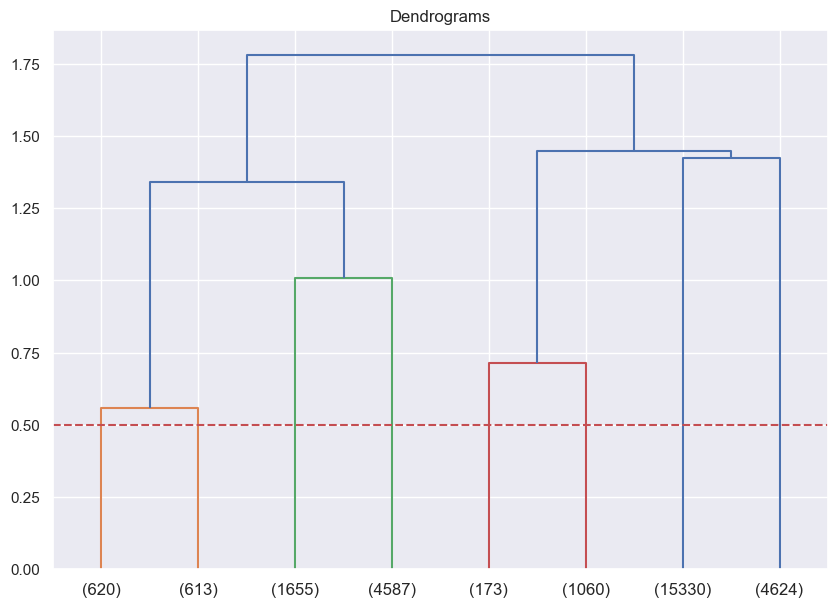

In [19]:
# Dendrogram
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(sample, method='complete',metric='cosine'),p=2,truncate_mode='level')
plt.axhline(y=0.5, color='r', linestyle='--')

In [20]:
# Preparing the Clusters
hierarchical = AgglomerativeClustering(n_clusters=8,affinity='cosine',linkage='complete') # Considering Euclidean Distance & Ward Linkage
hierarchical.fit(sample)
hierarchical.labels_

# Assigning Cluster Ids
sec_data["hc_clusterid"] = hierarchical.labels_
sec_data[0:10]
cluster_size = sec_data.groupby(['hc_clusterid']).size() 
print(cluster_size)

hc_clusterid
0    9887
1    2863
2    2941
3    6242
4    1761
5    1233
6    1233
7    2502
dtype: int64


In [21]:
# Evaluating the Clustering Method
hc_silhoutte = metrics.silhouette_score(sample, hierarchical.labels_)
print("Silhouette Coefficient: %0.3f"% hc_silhoutte)
# Silhouette score is between -1 and 1

hc_chi = metrics.calinski_harabasz_score(sample, hierarchical.labels_)
print("Calinski-Harabasz index: %0.3f"% hc_chi)
# Higher Calinski-Harabasz index the better

Silhouette Coefficient: 0.185
Calinski-Harabasz index: 4149.322


<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Analyzing the clusters
            </span>   
        </font>    
</h3>

In [22]:
values=['Open', 'High', 'Low', 'Adj Close', 'Volume']
index =['hc_clusterid']
aggfunc={'Open': np.mean,
         'High': np.mean,
         'Low':np.mean,
         'Adj Close':np.mean,
         'Volume':np.mean}
result = pd.pivot_table(sec_data,values=values,
                             index =index,
                             aggfunc=aggfunc,
                             fill_value=0)
result['cluster_size'] = cluster_size
result = result.round(2)
result

,Adj Close,High,Low,Open,Volume,cluster_size
hc_clusterid,,,,,,
0,201.02,209.97,204.55,207.43,33321647.15,9887
1,341.43,351.49,337.37,344.50,675290.01,2863
2,258.49,281.10,270.17,275.51,998357.18,2941
3,1676.15,1743.55,1688.33,1717.14,1262299.05,6242
4,541.38,561.76,544.30,553.52,8384085.69,1761
5,790.03,803.57,781.52,793.43,1353692.58,1233
6,706.44,718.23,699.38,709.37,14196866.08,1233
7,419.15,443.97,430.12,437.31,2705351.69,2502


In [23]:
sec_data[['Industry_Banking', 'Industry_Chemical', 'Industry_FMCG', 'Industry_Green Energy', 'Industry_Health Care', 'Industry_Tele Communication', 'Company Tick_ADANIGREEN.NS', 'Company Tick_AXISBANK.NS', 'Company Tick_BALAMINES.NS', 'Company Tick_BHARTIARTL.NS', 'Company Tick_BIOCON.NS', 'Company Tick_CANBK.NS', 'Company Tick_CIPLA.NS', 'Company Tick_DABUR.NS', 'Company Tick_GEPIL.NS', 'Company Tick_GODREJCP.NS', 'Company Tick_GRAUWEIL.NS', 'Company Tick_GREENPOWER.NS', 'Company Tick_HDB', 'Company Tick_HFCL.NS', 'Company Tick_HINDUNILVR.NS', 'Company Tick_IDEA.NS', 'Company Tick_LALPATHLAB.NS', 'Company Tick_MARICO.NS', 'Company Tick_SBIN.NS', 'Company Tick_SWSOLAR.NS', 'Company Tick_TATACHEM.NS', 'Company Tick_TATACOMM.NS', 'Company Tick_THYROCARE.NS', 'Company Tick_TIRUMALCHM.NS']]=dummydata[['Industry_Banking', 'Industry_Chemical', 'Industry_FMCG', 'Industry_Green Energy', 'Industry_Health Care', 'Industry_Tele Communication', 'Company Tick_ADANIGREEN.NS', 'Company Tick_AXISBANK.NS', 'Company Tick_BALAMINES.NS', 'Company Tick_BHARTIARTL.NS', 'Company Tick_BIOCON.NS', 'Company Tick_CANBK.NS', 'Company Tick_CIPLA.NS', 'Company Tick_DABUR.NS', 'Company Tick_GEPIL.NS', 'Company Tick_GODREJCP.NS', 'Company Tick_GRAUWEIL.NS', 'Company Tick_GREENPOWER.NS', 'Company Tick_HDB', 'Company Tick_HFCL.NS', 'Company Tick_HINDUNILVR.NS', 'Company Tick_IDEA.NS', 'Company Tick_LALPATHLAB.NS', 'Company Tick_MARICO.NS', 'Company Tick_SBIN.NS', 'Company Tick_SWSOLAR.NS', 'Company Tick_TATACHEM.NS', 'Company Tick_TATACOMM.NS', 'Company Tick_THYROCARE.NS', 'Company Tick_TIRUMALCHM.NS']]

In [24]:
values=['Industry_Banking', 'Industry_Chemical', 'Industry_FMCG', 'Industry_Green Energy', 'Industry_Health Care', 'Industry_Tele Communication']
index =['hc_clusterid']
aggfunc={'Industry_Banking': np.mean,
         'Industry_Chemical': np.mean,
         'Industry_FMCG':np.mean,
         'Industry_Green Energy':np.mean,
         'Industry_Health Care':np.mean,
         'Industry_Tele Communication':np.mean}
result = pd.pivot_table(sec_data,values=values,
                             index =index,
                             aggfunc=aggfunc,
                             fill_value=0)
result['cluster_size'] = cluster_size
result = result.round(2)
result

,Industry_Banking,Industry_Chemical,Industry_FMCG,Industry_Green Energy,Industry_Health Care,Industry_Tele Communication,cluster_size
hc_clusterid,,,,,,,
0,0.38,0.0,0.25,0.12,0.00,0.25,9887
1,0.00,0.0,0.00,1.00,0.00,0.00,2863
2,0.00,1.0,0.00,0.00,0.00,0.00,2941
3,0.00,0.2,0.20,0.10,0.39,0.11,6242
4,0.00,0.0,0.00,0.00,0.00,1.00,1761
5,0.00,0.0,1.00,0.00,0.00,0.00,1233
6,1.00,0.0,0.00,0.00,0.00,0.00,1233
7,0.00,0.0,0.00,0.00,1.00,0.00,2502


In [25]:
first_cluster_companies = result.columns[result.iloc[0] > 0]
print(first_cluster_companies)
second_cluster_companies = result.columns[result.iloc[1] > 0]
print(second_cluster_companies)
third_cluster_companies = result.columns[result.iloc[2] > 0]
print(third_cluster_companies)
fourth_cluster_companies = result.columns[result.iloc[3] > 0]
print(fourth_cluster_companies)
fifth_cluster_companies = result.columns[result.iloc[4] > 0]
print(fifth_cluster_companies)
sixth_cluster_companies = result.columns[result.iloc[5] > 0]
print(sixth_cluster_companies)
seventh_cluster_companies = result.columns[result.iloc[6] > 0]
print(seventh_cluster_companies)
eigth_cluster_companies = result.columns[result.iloc[7] > 0]
print(eigth_cluster_companies)

Index(['Industry_Banking', 'Industry_FMCG', 'Industry_Green Energy',
       'Industry_Tele Communication', 'cluster_size'],
      dtype='object')
Index(['Industry_Green Energy', 'cluster_size'], dtype='object')
Index(['Industry_Chemical', 'cluster_size'], dtype='object')
Index(['Industry_Chemical', 'Industry_FMCG', 'Industry_Green Energy',
       'Industry_Health Care', 'Industry_Tele Communication', 'cluster_size'],
      dtype='object')
Index(['Industry_Tele Communication', 'cluster_size'], dtype='object')
Index(['Industry_FMCG', 'cluster_size'], dtype='object')
Index(['Industry_Banking', 'cluster_size'], dtype='object')
Index(['Industry_Health Care', 'cluster_size'], dtype='object')


In [26]:
values=['Company Tick_ADANIGREEN.NS', 'Company Tick_AXISBANK.NS', 'Company Tick_BALAMINES.NS', 
        'Company Tick_BHARTIARTL.NS', 'Company Tick_BIOCON.NS', 'Company Tick_CANBK.NS', 
        'Company Tick_CIPLA.NS', 'Company Tick_DABUR.NS', 'Company Tick_GEPIL.NS', 
        'Company Tick_GODREJCP.NS', 'Company Tick_GRAUWEIL.NS', 'Company Tick_GREENPOWER.NS', 
        'Company Tick_HDB', 'Company Tick_HFCL.NS', 'Company Tick_HINDUNILVR.NS', 
        'Company Tick_IDEA.NS', 'Company Tick_LALPATHLAB.NS', 'Company Tick_MARICO.NS', 
        'Company Tick_SBIN.NS', 'Company Tick_SWSOLAR.NS', 'Company Tick_TATACHEM.NS', 
        'Company Tick_TATACOMM.NS', 'Company Tick_THYROCARE.NS', 'Company Tick_TIRUMALCHM.NS']
index =['hc_clusterid']
aggfunc={'Company Tick_ADANIGREEN.NS': np.mean,
         'Company Tick_AXISBANK.NS': np.mean,
         'Company Tick_BALAMINES.NS':np.mean,
         'Company Tick_BHARTIARTL.NS':np.mean,
         'Company Tick_BIOCON.NS':np.mean,
         'Company Tick_CANBK.NS':np.mean,
        'Company Tick_CIPLA.NS': np.mean,
         'Company Tick_DABUR.NS': np.mean,
         'Company Tick_GEPIL.NS':np.mean,
         'Company Tick_GODREJCP.NS':np.mean,
         'Company Tick_GRAUWEIL.NS':np.mean,
         'Company Tick_GREENPOWER.NS':np.mean,
        'Company Tick_HDB': np.mean,
         'Company Tick_HFCL.NS': np.mean,
         'Company Tick_HINDUNILVR.NS':np.mean,
         'Company Tick_IDEA.NS':np.mean,
         'Company Tick_LALPATHLAB.NS':np.mean,
         'Company Tick_MARICO.NS':np.mean,
        'Company Tick_SBIN.NS': np.mean,
         'Company Tick_SWSOLAR.NS': np.mean,
         'Company Tick_TATACHEM.NS':np.mean,
         'Company Tick_TATACOMM.NS':np.mean,
         'Company Tick_THYROCARE.NS':np.mean,
         'Company Tick_TIRUMALCHM.NS':np.mean}
result1 = pd.pivot_table(sec_data,values=values,
                             index =index,
                             aggfunc=aggfunc,
                             fill_value=0)
result1['cluster_size'] = cluster_size
result1 = result1.round(2)
result1

,Company Tick_ADANIGREEN.NS,Company Tick_AXISBANK.NS,Company Tick_BALAMINES.NS,Company Tick_BHARTIARTL.NS,Company Tick_BIOCON.NS,Company Tick_CANBK.NS,Company Tick_CIPLA.NS,Company Tick_DABUR.NS,Company Tick_GEPIL.NS,Company Tick_GODREJCP.NS,...,Company Tick_IDEA.NS,Company Tick_LALPATHLAB.NS,Company Tick_MARICO.NS,Company Tick_SBIN.NS,Company Tick_SWSOLAR.NS,Company Tick_TATACHEM.NS,Company Tick_TATACOMM.NS,Company Tick_THYROCARE.NS,Company Tick_TIRUMALCHM.NS,cluster_size
hc_clusterid,,,,,,,,,,,,,,,,,,,,,
0,0.00,0,0.00,0.0,0.00,0.12,0.00,0.12,0.00,0,...,0.12,0.0,0.12,0.12,0.00,0.00,0.00,0.00,0.00,9887
1,0.22,0,0.00,0.0,0.00,0.00,0.00,0.00,0.43,0,...,0.00,0.0,0.00,0.00,0.35,0.00,0.00,0.00,0.00,2863
2,0.00,0,0.16,0.0,0.00,0.00,0.00,0.00,0.00,0,...,0.00,0.0,0.00,0.00,0.00,0.24,0.00,0.00,0.42,2941
3,0.10,0,0.12,0.0,0.00,0.00,0.12,0.00,0.00,0,...,0.00,0.2,0.00,0.00,0.00,0.08,0.11,0.07,0.00,6242
4,0.00,0,0.00,0.7,0.00,0.00,0.00,0.00,0.00,0,...,0.00,0.0,0.00,0.00,0.00,0.00,0.30,0.00,0.00,1761
5,0.00,0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,1,...,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1233
6,0.00,1,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0,...,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1233
7,0.00,0,0.00,0.0,0.49,0.00,0.19,0.00,0.00,0,...,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.32,0.00,2502


In [27]:
first_cluster_companies = result1.columns[result1.iloc[0] > 0]
print(first_cluster_companies)
second_cluster_companies = result1.columns[result1.iloc[1] > 0]
print(second_cluster_companies)
third_cluster_companies = result1.columns[result1.iloc[2] > 0]
print(third_cluster_companies)
fourth_cluster_companies = result1.columns[result1.iloc[3] > 0]
print(fourth_cluster_companies)
fifth_cluster_companies = result1.columns[result1.iloc[4] > 0]
print(fifth_cluster_companies)
sixth_cluster_companies = result1.columns[result1.iloc[5] > 0]
print(sixth_cluster_companies)
seventh_cluster_companies = result1.columns[result1.iloc[6] > 0]
print(seventh_cluster_companies)
eigth_cluster_companies = result1.columns[result1.iloc[7] > 0]
print(eigth_cluster_companies)

Index(['Company Tick_CANBK.NS', 'Company Tick_DABUR.NS',
       'Company Tick_GREENPOWER.NS', 'Company Tick_HDB',
       'Company Tick_HFCL.NS', 'Company Tick_IDEA.NS',
       'Company Tick_MARICO.NS', 'Company Tick_SBIN.NS', 'cluster_size'],
      dtype='object')
Index(['Company Tick_ADANIGREEN.NS', 'Company Tick_GEPIL.NS',
       'Company Tick_SWSOLAR.NS', 'cluster_size'],
      dtype='object')
Index(['Company Tick_BALAMINES.NS', 'Company Tick_GRAUWEIL.NS',
       'Company Tick_TATACHEM.NS', 'Company Tick_TIRUMALCHM.NS',
       'cluster_size'],
      dtype='object')
Index(['Company Tick_ADANIGREEN.NS', 'Company Tick_BALAMINES.NS',
       'Company Tick_CIPLA.NS', 'Company Tick_HINDUNILVR.NS',
       'Company Tick_LALPATHLAB.NS', 'Company Tick_TATACHEM.NS',
       'Company Tick_TATACOMM.NS', 'Company Tick_THYROCARE.NS',
       'cluster_size'],
      dtype='object')
Index(['Company Tick_BHARTIARTL.NS', 'Company Tick_TATACOMM.NS',
       'cluster_size'],
      dtype='object')
Index(['Com

In [28]:
stock_analysis = sec_data1.groupby('Company Tick')['Adj_Close_Log_Returns'].agg(['mean', 'std'])

# Multiply 'mean' column by 250
stock_analysis['mean'] *= 250

# Multiply 'std' column by sqrt(250)
stock_analysis['std'] *= np.sqrt(250)

stock_analysis['Return (%)'] = round(stock_analysis['mean'],5)* 100

stock_analysis['Risk (%)'] = round(stock_analysis['std']**2,5)* 100

stock_analysis

,mean,std,Return (%),Risk (%)
Company Tick,,,,
ADANIGREEN.NS,0.579190,0.543830,57.919,29.575
AXISBANK.NS,0.090749,0.378556,9.075,14.330
BALAMINES.NS,0.289934,0.517231,28.993,26.753
BHARTIARTL.NS,0.184709,0.321299,18.471,10.323
BIOCON.NS,-0.030925,0.325921,-3.092,10.622
CANBK.NS,0.041788,0.446318,4.179,19.920
CIPLA.NS,0.137828,0.274278,13.783,7.523
DABUR.NS,0.044022,0.241710,4.402,5.842
GEPIL.NS,-0.311091,0.432475,-31.109,18.703


<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Modelling: Holt-Winters Exponential Smoothing
            </span>   
        </font>    
</h3>

In [48]:
# Define the list of tickers
tickers = ['BHARTIARTL.NS', 'HFCL.NS', 'MARICO.NS', 'SBIN.NS']

# Create an empty DataFrame to store the data
mysec_data = pd.DataFrame()

# Create a dictionary to store the fitted models
te_mod_add_dict = {}
te_mod_mul_dict = {}
results = pd.DataFrame()

# Loop through each ticker and fetch the data
for ticker in tickers:
    stock_data = yf.download(ticker, start='2008-09-01', end='2023-09-01', progress=False)
    
    # Extract Close and Adj Close columns and rename them
    stock_data = stock_data[['Close', 'Adj Close']]
    stock_data.columns = [f"{ticker}_Close", f"{ticker}_Adj_Close"]
    
    # Concatenate the data for this ticker with the overall data
    mysec_data = pd.concat([mysec_data, stock_data], axis=1)

# Set the frequency for the data
mysec_data.index = pd.to_datetime(mysec_data.index)
mysec_data_monthly = mysec_data.resample('MS').mean()
mysec_data_monthly.index.freq = 'MS'

# Define the list of stocks to forecast
stocks_to_forecast = [f"{ticker}_Adj_Close" for ticker in tickers]

# Set the forecasting horizon (e.g., 12 months)
forecast_horizon = 36


Stock: BHARTIARTL.NS_Adj_Close


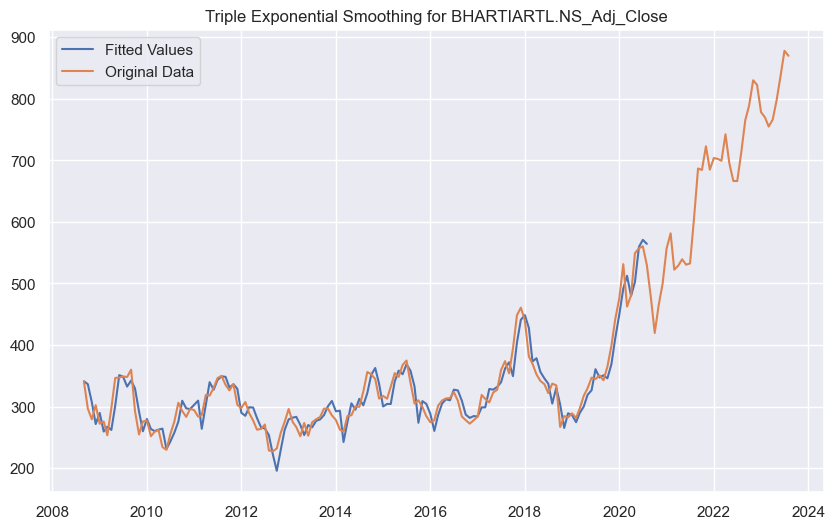

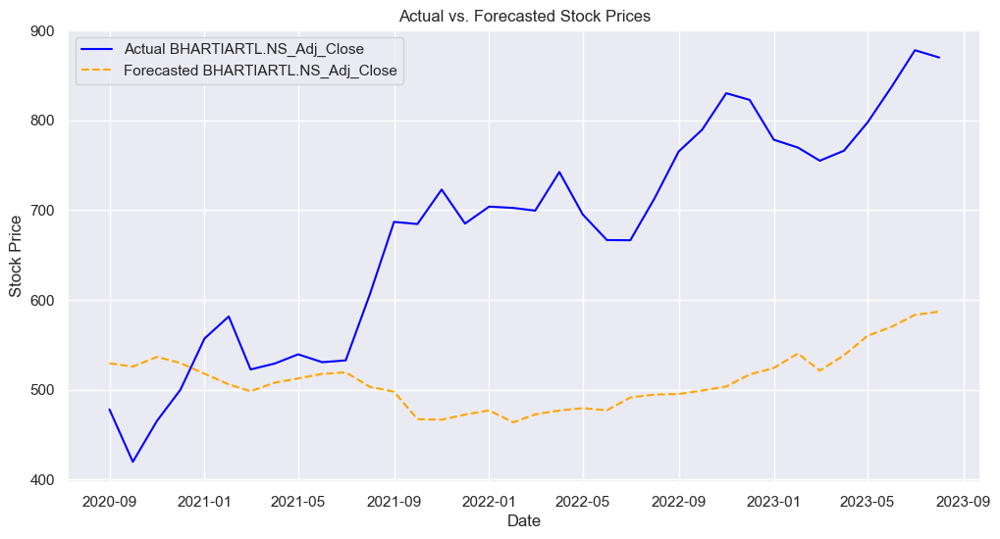

RMSE for BHARTIARTL.NS_Adj_Close: 204.301
 
-----------------------------------------------------------------------------------------------------------------------------
 
Stock: HFCL.NS_Adj_Close


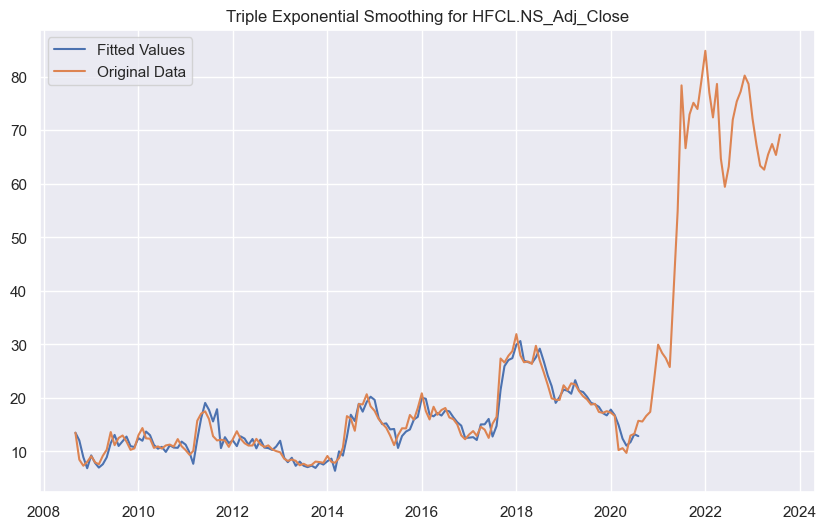

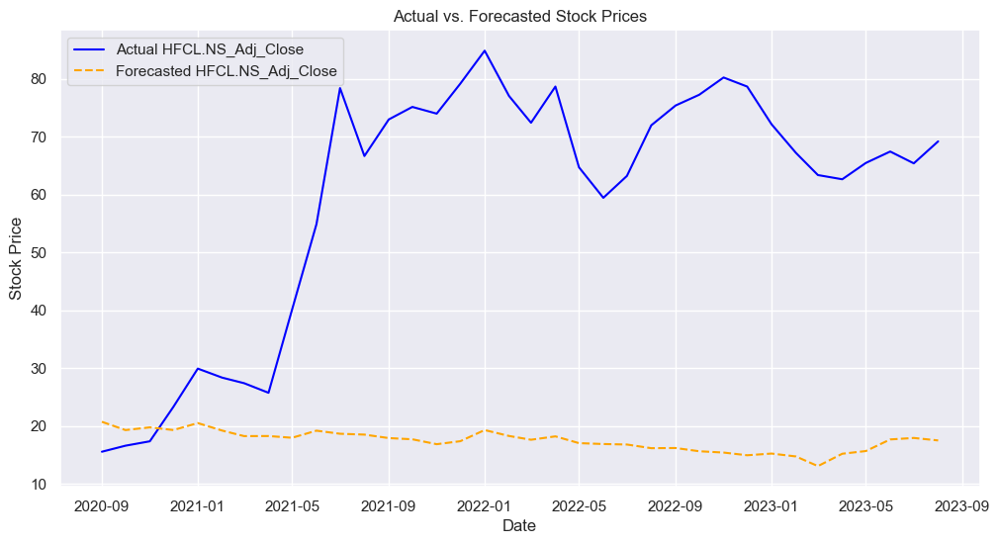

RMSE for HFCL.NS_Adj_Close: 47.536
 
-----------------------------------------------------------------------------------------------------------------------------
 
Stock: MARICO.NS_Adj_Close


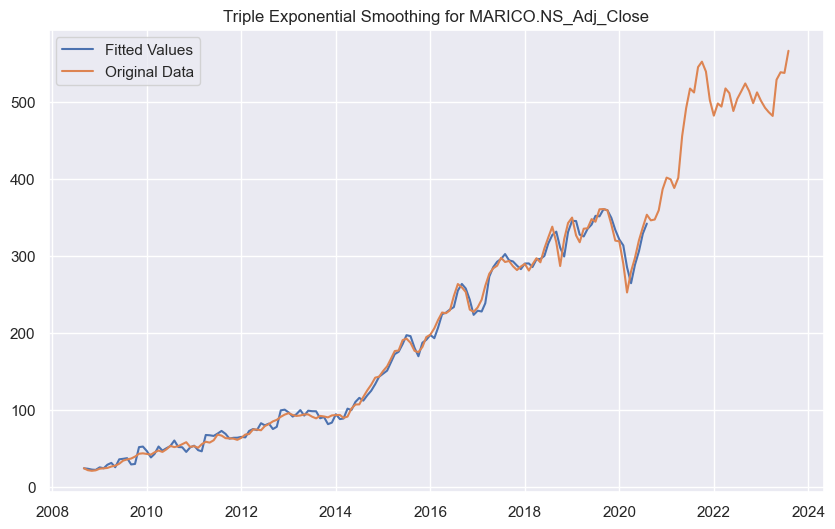

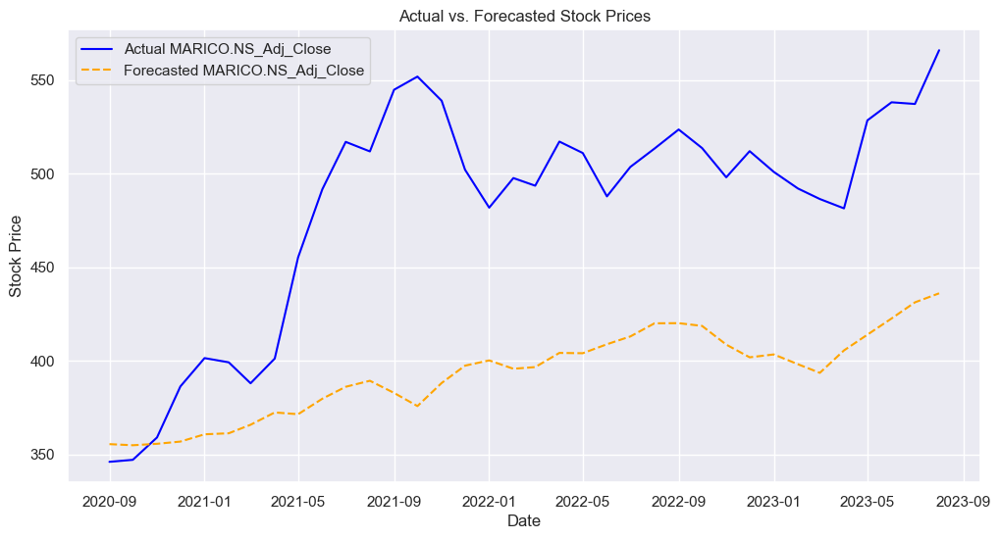

RMSE for MARICO.NS_Adj_Close: 98.465
 
-----------------------------------------------------------------------------------------------------------------------------
 
Stock: SBIN.NS_Adj_Close


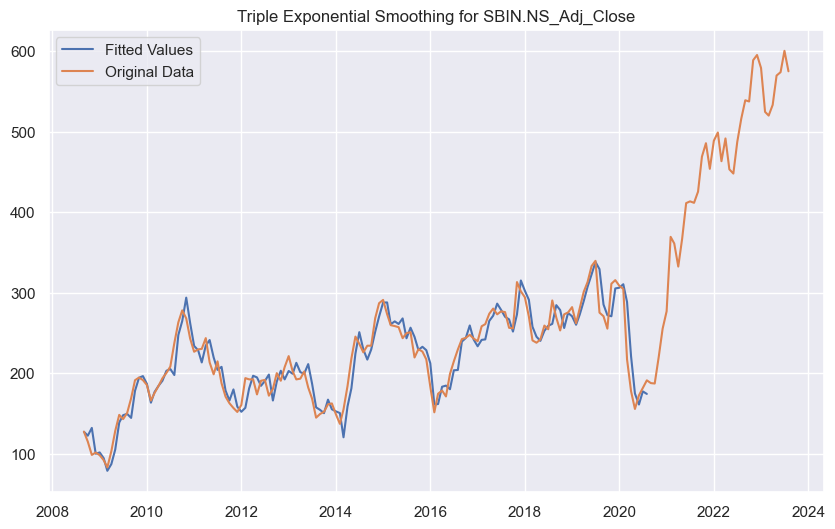

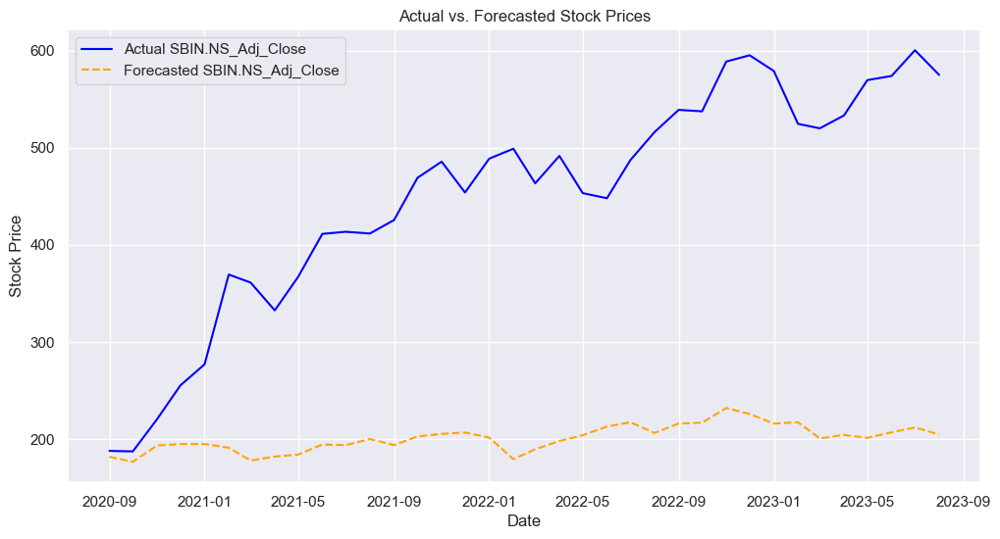

RMSE for SBIN.NS_Adj_Close: 270.464
 
-----------------------------------------------------------------------------------------------------------------------------
 


In [49]:
# Triple Exponential Smoothing - Additive
# Create a dictionary to store results
results = {}

# Loop through each stock for forecasting and plotting
for stock in stocks_to_forecast:
    print(f"Stock: {stock}")
    
    # Extract the historical data for the current stock
    historical_data = mysec_data_monthly[[stock]].copy()
    
    # Check for and handle missing data
    if historical_data.isnull().any().any():
        print(f"Missing data found for {stock}. Skipping...")
        continue
    
    # Determine the split point for training and testing
    split_percentage = 0.8
    split_point = int(len(historical_data) * split_percentage)

    if split_point <= 0:
        print(f"Not enough data to split for {stock}. Skipping...")
        continue

    historical_data_train = historical_data.iloc[:split_point]
    historical_data_test = historical_data.iloc[split_point:]

    # Fit a Triple Exponential Smoothing model (additive)
    model = ExponentialSmoothing(historical_data_train, trend='add', seasonal='add', seasonal_periods=36)

    try:
        model_fit = model.fit()
    except Exception as e:
        print(f"Error fitting model for {stock}: {str(e)}. Skipping...")
        continue

    # Store the fitted model in the results dictionary
    te_mod_add_dict[f"{stock}_te_mod_add"] = model_fit
    
    # Plot the fitted values and original data
    plt.figure(figsize=(10, 6))
    plt.plot(model_fit.fittedvalues, label="Fitted Values")
    plt.plot(historical_data, label="Original Data")
    plt.title(f"Triple Exponential Smoothing for {stock}")
    plt.legend()
    plt.show()

    # Calculate RMSE for each stock's forecast
    try:
        forecast = model_fit.forecast(steps=forecast_horizon)
        rmse = np.sqrt(mean_squared_error(historical_data_test[stock][-forecast_horizon:], forecast))
    except Exception as e:
        print(f"Error calculating RMSE for {stock}: {str(e)}. Skipping...")
        continue

    # Store the forecasted values in the results dictionary
    results[stock + '_Adj_Close_te_mod_add'] = forecast

    # Create a DataFrame for the historical data
    historical_data_df = pd.DataFrame({
        'Date': historical_data_test.index[-forecast_horizon:],
        'Actual ' + stock: historical_data_test[stock][-forecast_horizon:],
        'Forecasted ' + stock: forecast
    })

    # Plot the actual and forecasted values
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data_df['Date'], historical_data_df['Actual ' + stock], label='Actual ' + stock, color='blue')
    plt.plot(historical_data_df['Date'], historical_data_df['Forecasted ' + stock], linestyle='--', label='Forecasted ' + stock, color='orange')
    plt.title('Actual vs. Forecasted Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Display the RMSE for each stock's forecast
    print(f'RMSE for {stock}: {round(rmse, 3)}')
    print(" ")
    print("-----------------------------------------------------------------------------------------------------------------------------")
    print(" ")

# Now you have the results dictionary containing forecasts for all stocks


Stock: BHARTIARTL.NS_Adj_Close


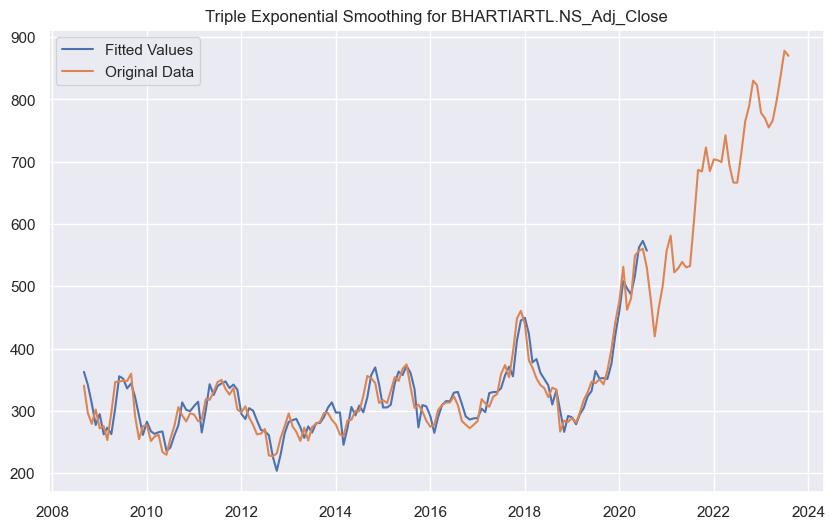

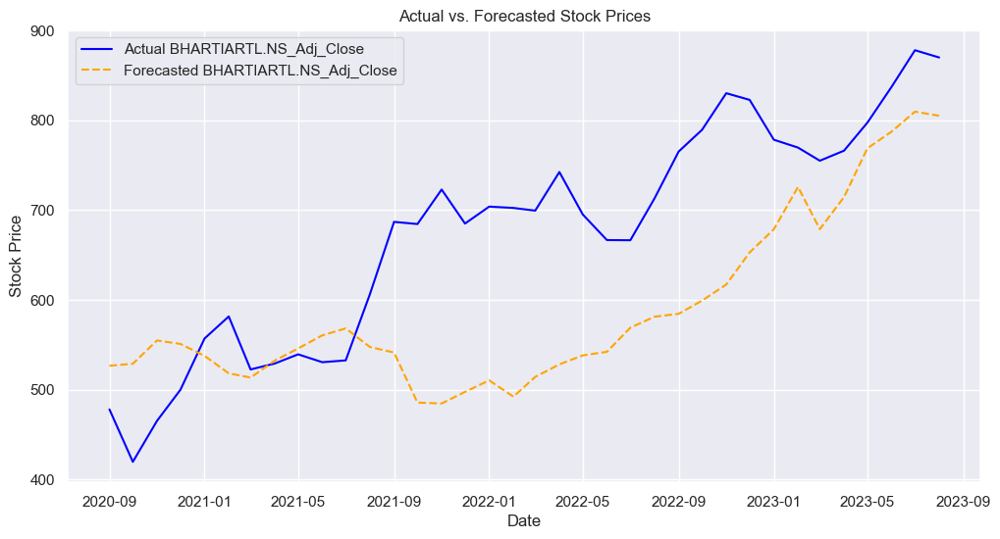

RMSE for BHARTIARTL.NS_Adj_Close: 128.307
 
-----------------------------------------------------------------------------------------------------------------------------
 
Stock: HFCL.NS_Adj_Close


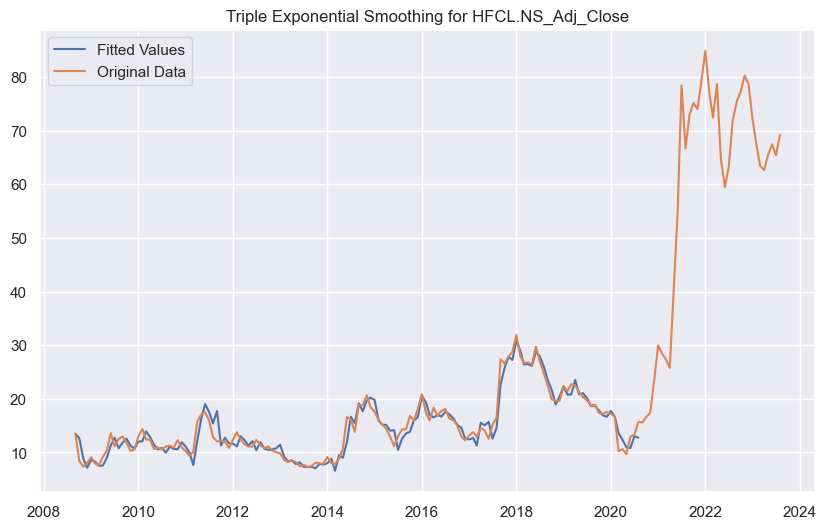

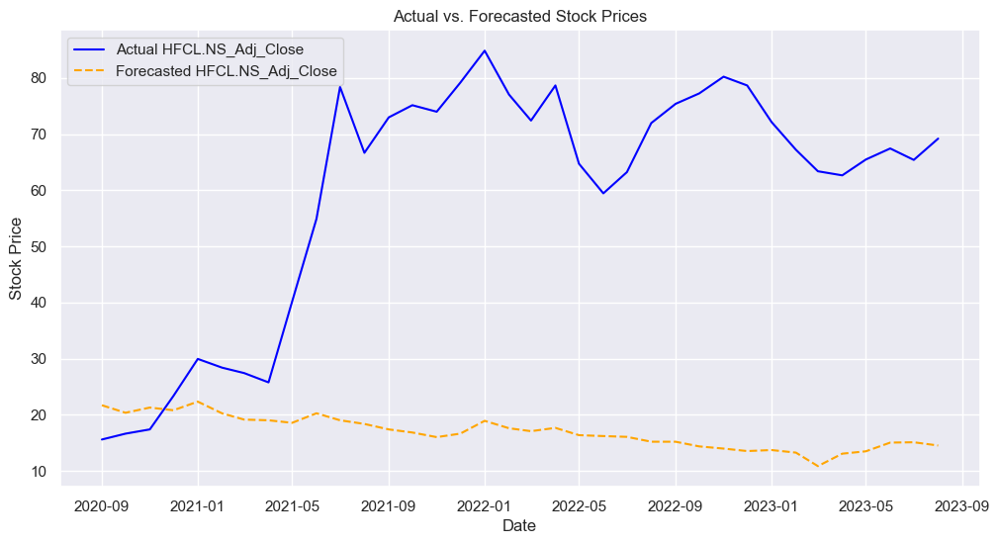

RMSE for HFCL.NS_Adj_Close: 48.498
 
-----------------------------------------------------------------------------------------------------------------------------
 
Stock: MARICO.NS_Adj_Close


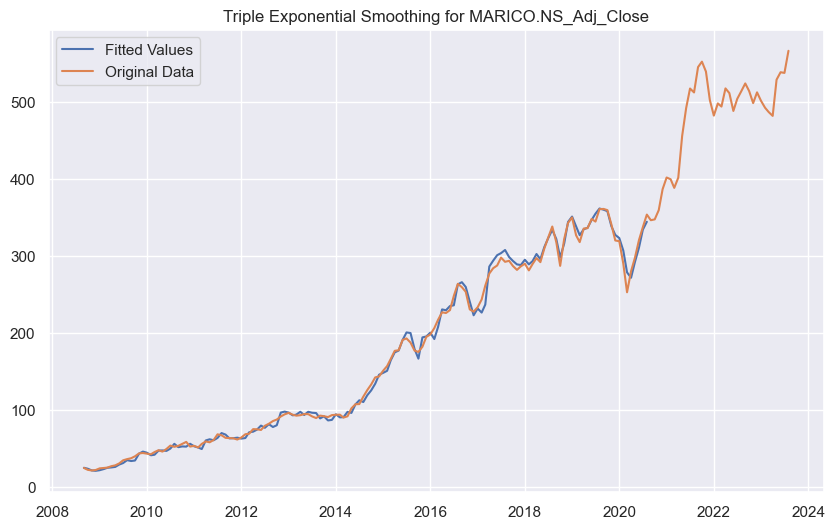

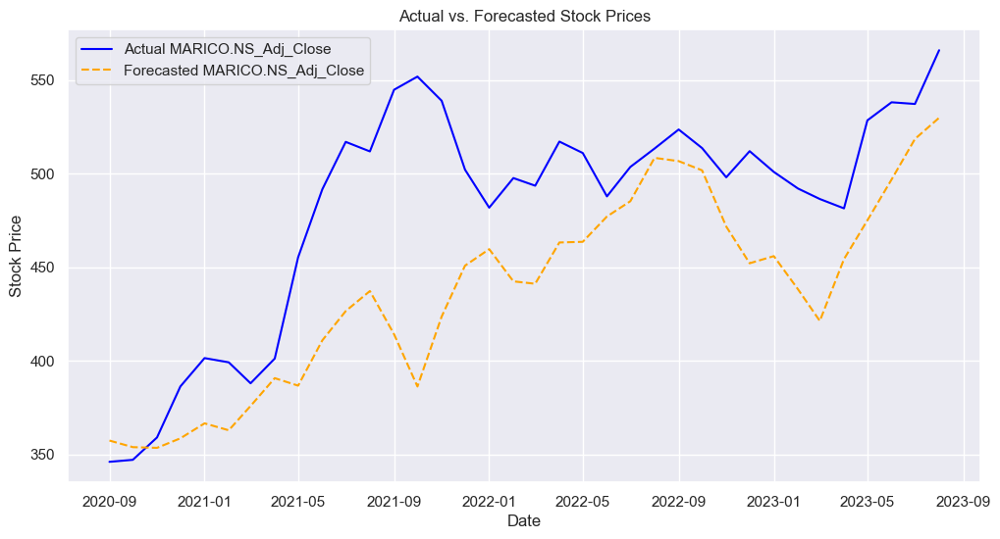

RMSE for MARICO.NS_Adj_Close: 58.189
 
-----------------------------------------------------------------------------------------------------------------------------
 
Stock: SBIN.NS_Adj_Close


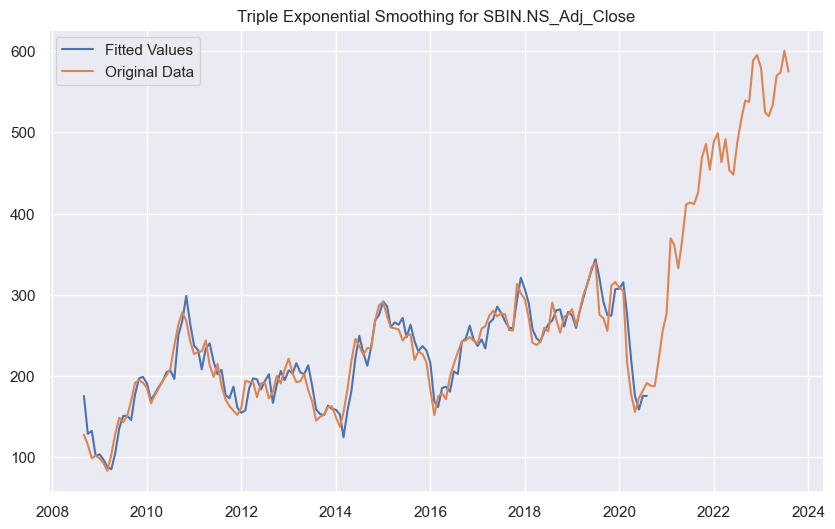

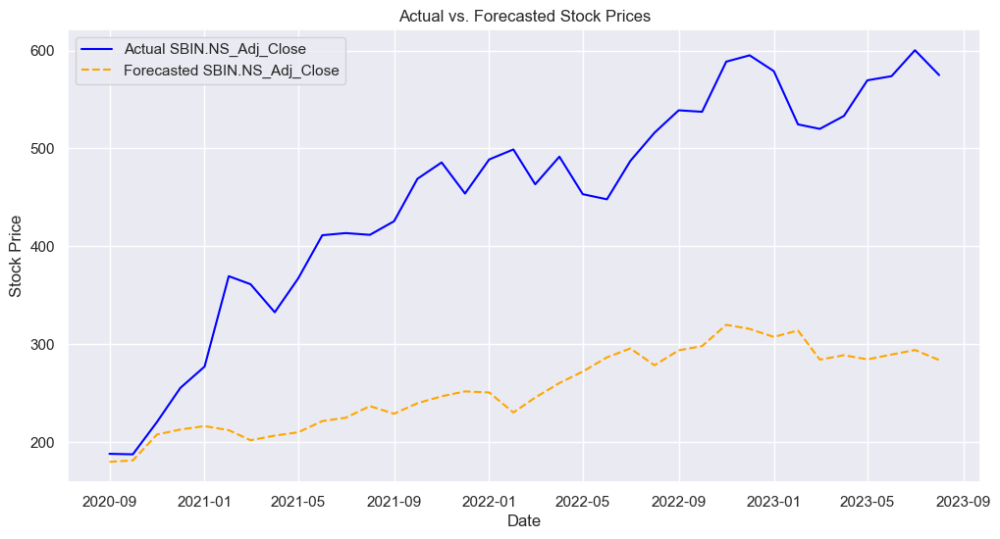

RMSE for SBIN.NS_Adj_Close: 211.669
 
-----------------------------------------------------------------------------------------------------------------------------
 


In [50]:
# Triple Exponential Smoothing - Multiplicative
# Create a dictionary to store results
results = {}

# Loop through each stock for forecasting and plotting
for stock in stocks_to_forecast:
    print(f"Stock: {stock}")
    
    # Extract the historical data for the current stock
    historical_data = mysec_data_monthly[[stock]].copy()
    
    # Check for and handle missing data
    if historical_data.isnull().any().any():
        print(f"Missing data found for {stock}. Skipping...")
        continue
    
    # Determine the split point for training and testing
    split_percentage = 0.8
    split_point = int(len(historical_data) * split_percentage)

    if split_point <= 0:
        print(f"Not enough data to split for {stock}. Skipping...")
        continue

    historical_data_train = historical_data.iloc[:split_point]
    historical_data_test = historical_data.iloc[split_point:]

    # Fit a Triple Exponential Smoothing model (additive)
    model = ExponentialSmoothing(historical_data_train, trend='mul', seasonal='mul', seasonal_periods=36)

    try:
        model_fit = model.fit()
    except Exception as e:
        print(f"Error fitting model for {stock}: {str(e)}. Skipping...")
        continue

    # Store the fitted model in the results dictionary
    te_mod_mul_dict[f"{stock}_te_mod_mul"] = model_fit
    
    # Plot the fitted values and original data
    plt.figure(figsize=(10, 6))
    plt.plot(model_fit.fittedvalues, label="Fitted Values")
    plt.plot(historical_data, label="Original Data")
    plt.title(f"Triple Exponential Smoothing for {stock}")
    plt.legend()
    plt.show()

    # Calculate RMSE for each stock's forecast
    try:
        forecast = model_fit.forecast(steps=forecast_horizon)
        rmse = np.sqrt(mean_squared_error(historical_data_test[stock][-forecast_horizon:], forecast))
    except Exception as e:
        print(f"Error calculating RMSE for {stock}: {str(e)}. Skipping...")
        continue

    # Store the forecasted values in the results dictionary
    results[stock + '_Adj_Close_te_mod_mul'] = forecast

    # Create a DataFrame for the historical data
    historical_data_df = pd.DataFrame({
        'Date': historical_data_test.index[-forecast_horizon:],
        'Actual ' + stock: historical_data_test[stock][-forecast_horizon:],
        'Forecasted ' + stock: forecast
    })

    # Plot the actual and forecasted values
    plt.figure(figsize=(12, 6))
    plt.plot(historical_data_df['Date'], historical_data_df['Actual ' + stock], label='Actual ' + stock, color='blue')
    plt.plot(historical_data_df['Date'], historical_data_df['Forecasted ' + stock], linestyle='--', label='Forecasted ' + stock, color='orange')
    plt.title('Actual vs. Forecasted Stock Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Price')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Display the RMSE for each stock's forecast
    print(f'RMSE for {stock}: {round(rmse, 3)}')
    print(" ")
    print("-----------------------------------------------------------------------------------------------------------------------------")
    print(" ")

# Now you have the results dictionary containing forecasts for all stocks


<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Modelling: SVM Classification
            </span>   
        </font>    
</h3>

In [51]:
# RoC Curve

# RoC Curve can be used to understand the overall performance of a logistic regression model and used for model selection
# RoC Curve is a plot between False positive rate [FP / (TN + FP)] and True positive rate [TP / (TP+FN)]
# Higher the AUC, better the model
# AUC < 0.5 model is inferior to a case of having no model
# AUC > 0.7 model is useful

def draw_roc( actual, probs ):
    fpr, \
    tpr, \
    thresholds = metrics.roc_curve( actual, probs, drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(8, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

In [52]:
# Confusion Matrix
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    ---------
    cf:            confusion matrix to be passed in
    group_names:   List of strings that represent the labels row by row to be shown in each square.
    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'
    count:         If True, show the raw number in the confusion matrix. Default is True.
    normalize:     If True, show the proportions for each category. Default is True.
    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.
    xyticks:       If True, show x and y ticks. Default is True.
    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.
    sum_stats:     If True, display summary statistics below the figure. Default is True.
    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.
    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.
    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sn.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

In [68]:
# Define the list of tickers
tickers = ['BHARTIARTL.NS', 'HFCL.NS', 'MARICO.NS', 'SBIN.NS']

# Create an empty DataFrame to store the data
mysec_data = pd.DataFrame()

# Loop through each ticker and fetch the data
for ticker in tickers:
    stock_data = yf.download(ticker, start='2023-08-15', end='2023-09-01', progress=False)
    
    # Extract Open, Close, Adj Close, and Volume columns and rename them
    stock_data = stock_data[['Open', 'Close', 'Adj Close', 'Volume']]
    stock_data.columns = [f"{ticker}_{col}" for col in stock_data.columns]
    
    # Concatenate the data for this ticker with the overall data
    mysec_data = pd.concat([mysec_data, stock_data], axis=1)

# Create a DataFrame for the target variable Price_Up for each ticker
Y_data = pd.DataFrame()

# Calculate daily price movements (1 for up, 0 for down) for each ticker
for ticker in tickers:
    price_up = (mysec_data[ticker + '_Close'].shift(-1) > mysec_data[ticker + '_Close']).astype(int)
    Y_data[ticker + '_Price_Up'] = price_up

# Drop rows with NaN values (last row will have NaN due to shift)
Y_data.dropna(inplace=True)

# Display the resulting DataFrames for features (X) and target variable (Y) for each ticker
X = mysec_data  # Features
Y = Y_data  # Target variable

# X contains Open, Close, Adj Close, and Volume data for each ticker
# Y contains Price_Up data for each ticker

# Drop rows with NaN values (last row will have NaN due to shift)
mysec_data.dropna(inplace=True)
Y_data.dropna(inplace=True)

priceup_counts = {}
for t in tickers:
    print(f"Stock: {t}")
    print("Value Counts are:")
    print(Y_data[t + '_Price_Up'].value_counts())

Stock: BHARTIARTL.NS
Value Counts are:
0    7
1    5
Name: BHARTIARTL.NS_Price_Up, dtype: int64
Stock: HFCL.NS
Value Counts are:
0    7
1    5
Name: HFCL.NS_Price_Up, dtype: int64
Stock: MARICO.NS
Value Counts are:
0    7
1    5
Name: MARICO.NS_Price_Up, dtype: int64
Stock: SBIN.NS
Value Counts are:
1    6
0    6
Name: SBIN.NS_Price_Up, dtype: int64


In [69]:
# Standardize predictors
scaler = StandardScaler()
X = scaler.fit_transform(mysec_data)

# Splitting dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(X, Y_data, test_size=0.3, random_state=42)

Stock: BHARTIARTL.NS


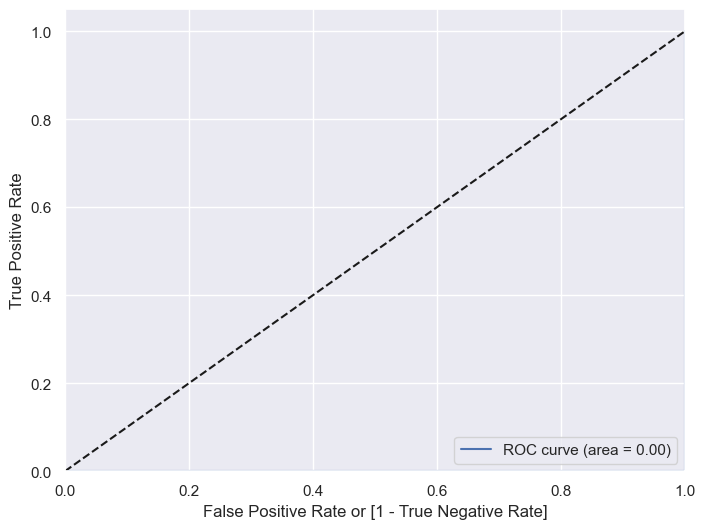

AUC Score: 0.0


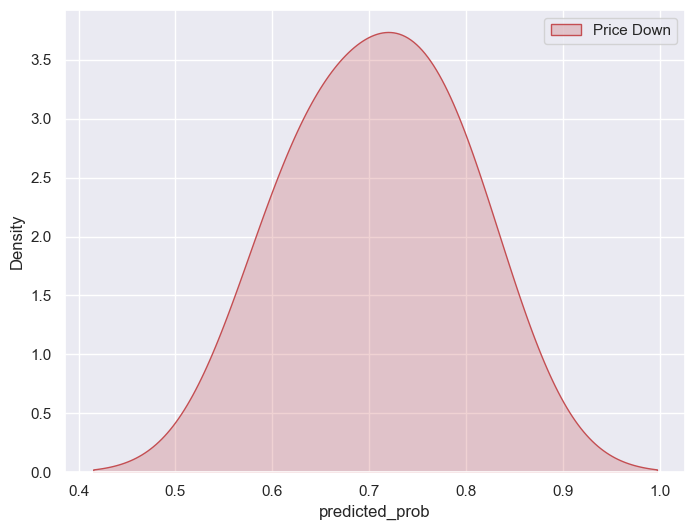

              precision    recall  f1-score   support

           0       0.67      0.67      0.67         3
           1       0.00      0.00      0.00         1

    accuracy                           0.50         4
   macro avg       0.33      0.33      0.33         4
weighted avg       0.50      0.50      0.50         4

Stock: HFCL.NS


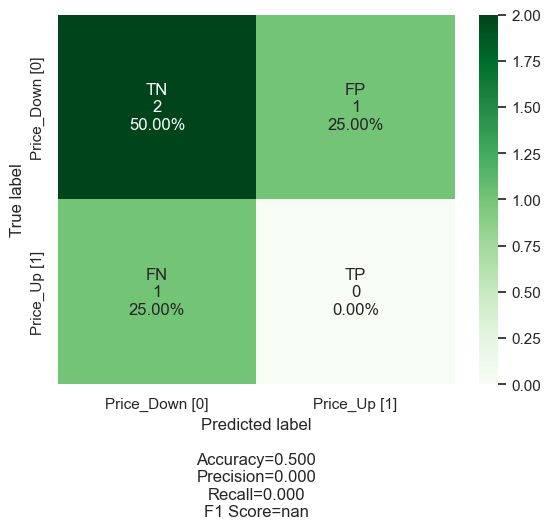

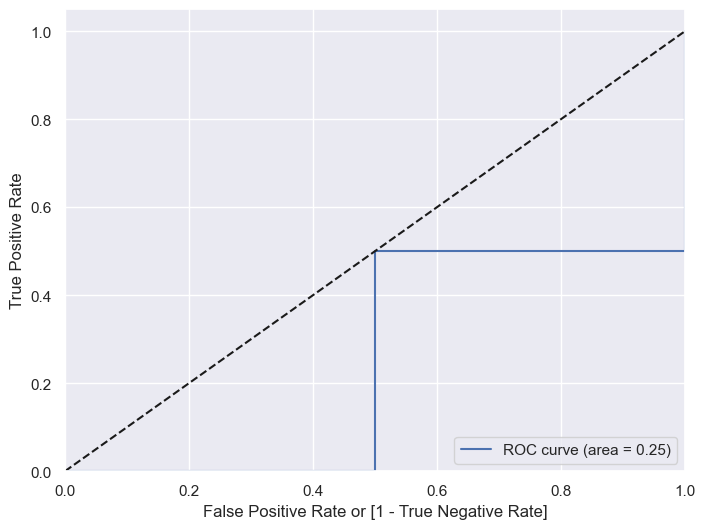

AUC Score: 0.25


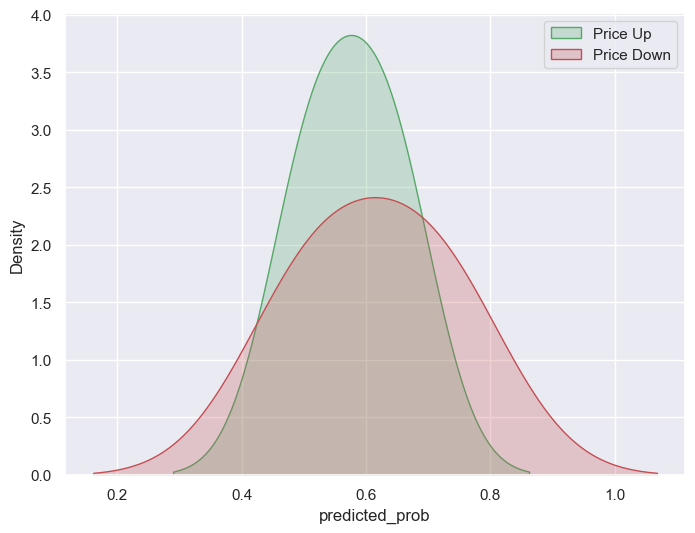

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       0.00      0.00      0.00         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4

Stock: MARICO.NS


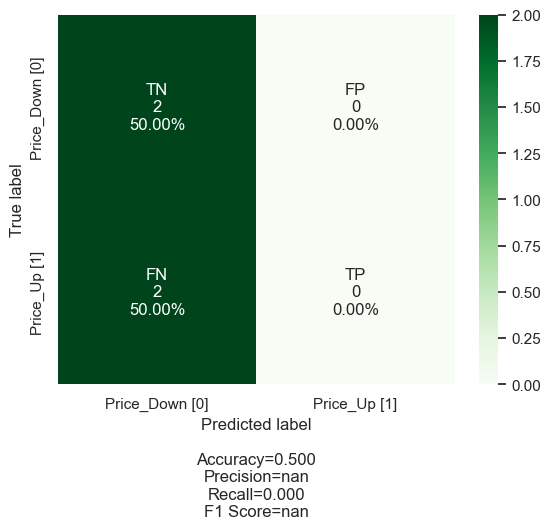

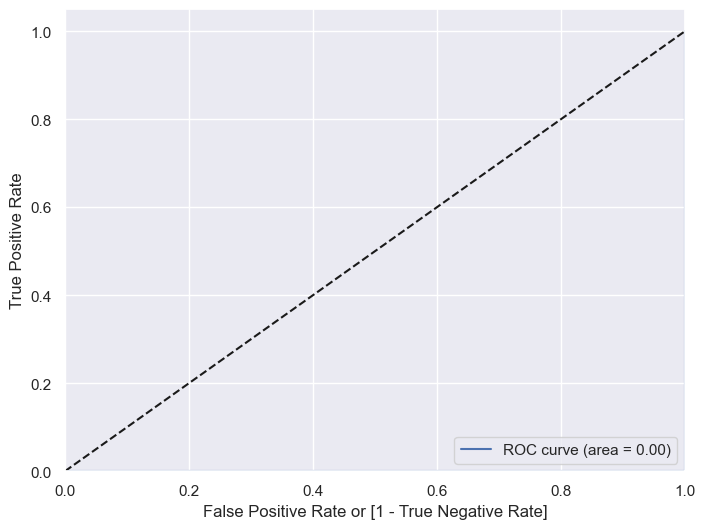

AUC Score: 0.0


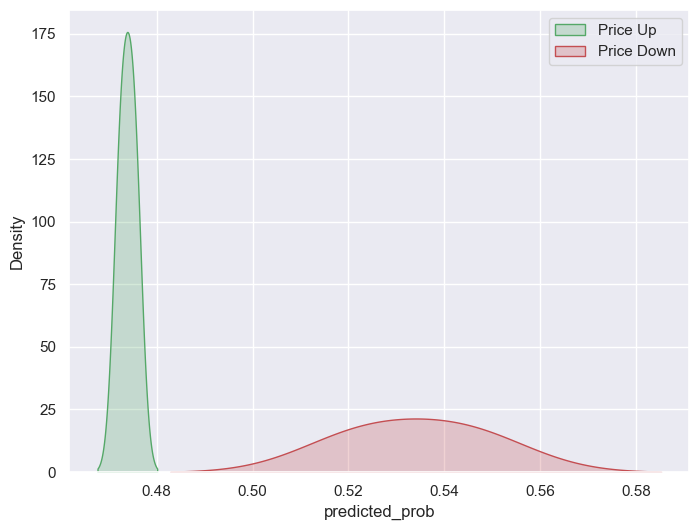

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       0.00      0.00      0.00         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4

Stock: SBIN.NS


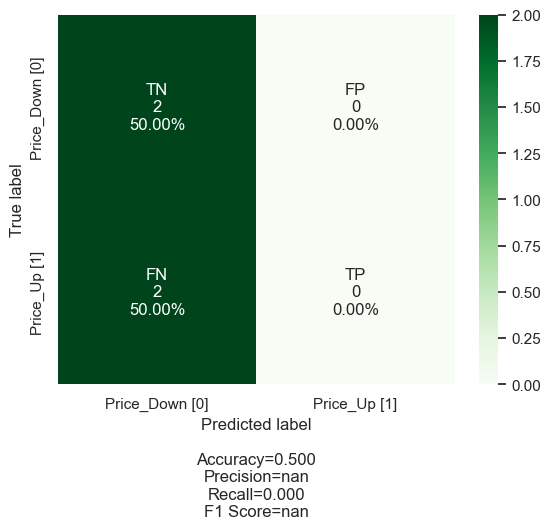

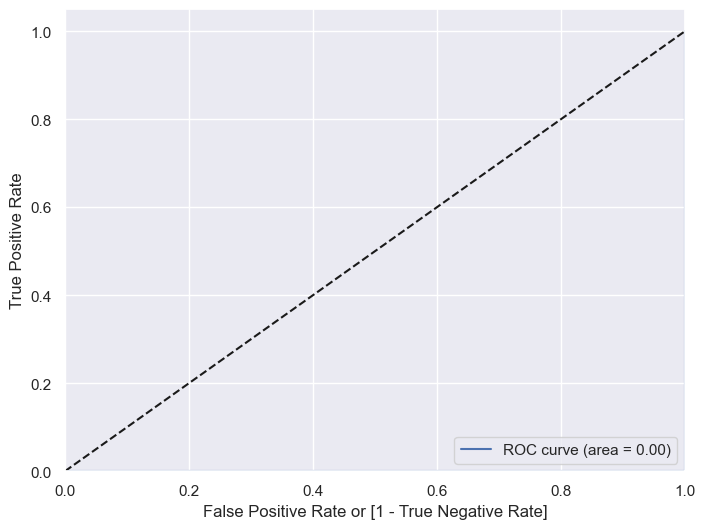

AUC Score: 0.0


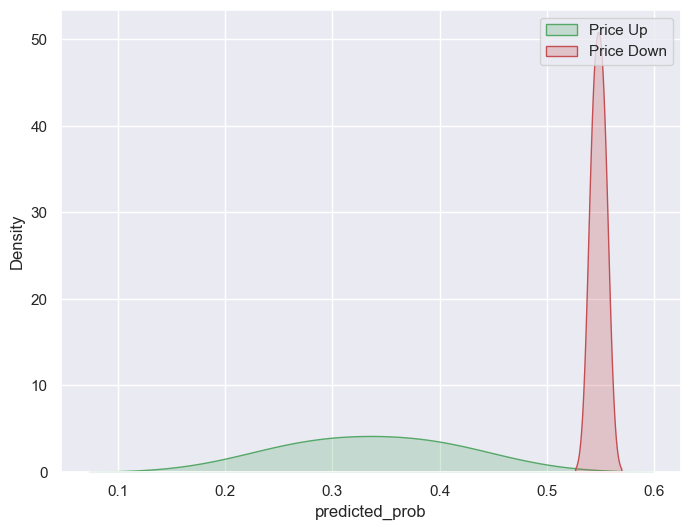

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       0.00      0.00      0.00         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4



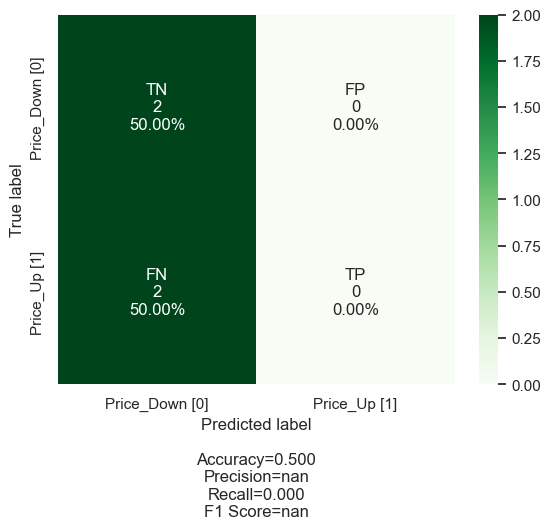

In [70]:
# Conduct Non-Linear SVM: RBF Kernel Classification for each ticker
for ticker in tickers:
    print(f"Stock: {ticker}")
    
    # Non-Linear SVM: RBF Kernel
    svc_nlinear_rbf = SVC(kernel="rbf", random_state=0, gamma="auto", C=0.75, probability=True)
    svc_nlinear_rbfmodel = svc_nlinear_rbf.fit(X_train, y_train[ticker + '_Price_Up'])

    # Extracting Probabilities
    pred_prob = pd.DataFrame(svc_nlinear_rbfmodel.predict_proba(X_test))[1]
    actual = y_test[ticker + '_Price_Up'].to_numpy()
    y_pred_df = pd.DataFrame({"actual": actual, "predicted_prob": pred_prob})

    # Classifier Performance
    # Plotting AUC
    fpr, tpr, thresholds = draw_roc(y_pred_df.actual, y_pred_df.predicted_prob)

    # Measuring Test Accuracy
    auc_score = metrics.roc_auc_score(y_pred_df.actual, y_pred_df.predicted_prob)
    print(f"AUC Score: {auc_score}")

    # Plotting Distributions and Identifying optimal probability
    plt.figure(figsize=(8, 6))
    sn.kdeplot(y_pred_df[y_pred_df.actual == 1]["predicted_prob"], color='g', shade=True, label='Price Up')
    sn.kdeplot(y_pred_df[y_pred_df.actual == 0]["predicted_prob"], color='r', shade=True, label='Price Down')
    plt.legend()
    plt.show()

    # Confusion Matrix and Performance Measure
    y_pred_df['predicted'] = y_pred_df.predicted_prob.map(lambda x: 1 if x > 0.75 else 0)

    cf_matrix = metrics.confusion_matrix(y_pred_df.actual, y_pred_df.predicted)
    labels = ["TN", "FP", "FN", "TP"]
    categories = ["Price_Down [0]", "Price_Up [1]"]
    make_confusion_matrix(cf_matrix, group_names=labels, categories=categories, cmap="Greens")

    print(metrics.classification_report(y_pred_df.actual, y_pred_df.predicted))


Stock: BHARTIARTL.NS


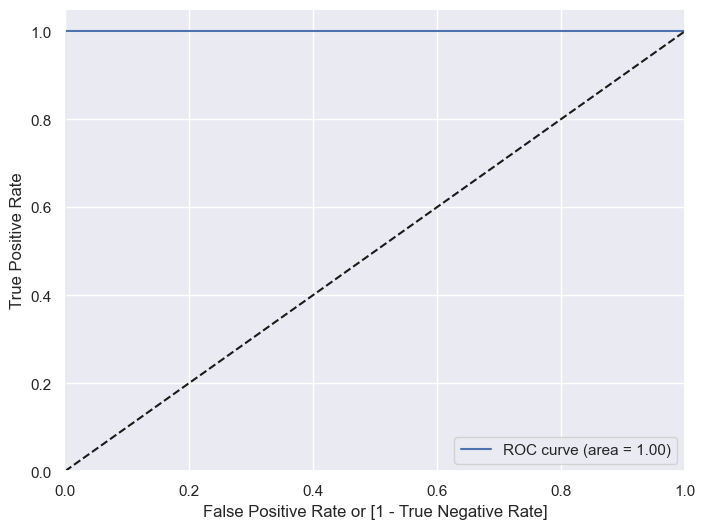

AUC Score: 1.0


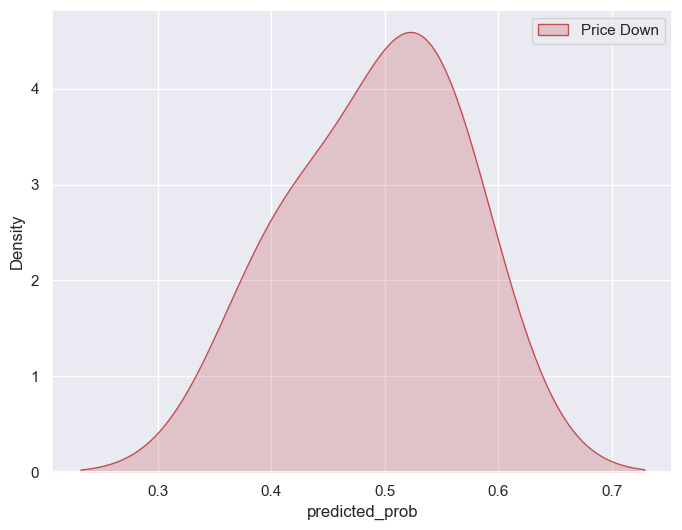

              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       0.00      0.00      0.00         1

    accuracy                           0.75         4
   macro avg       0.38      0.50      0.43         4
weighted avg       0.56      0.75      0.64         4

Stock: HFCL.NS


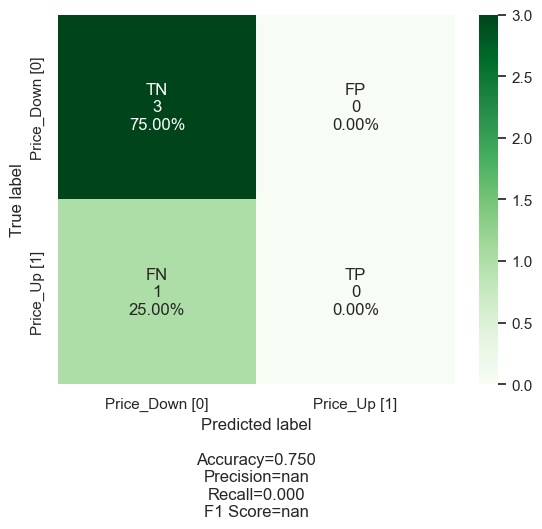

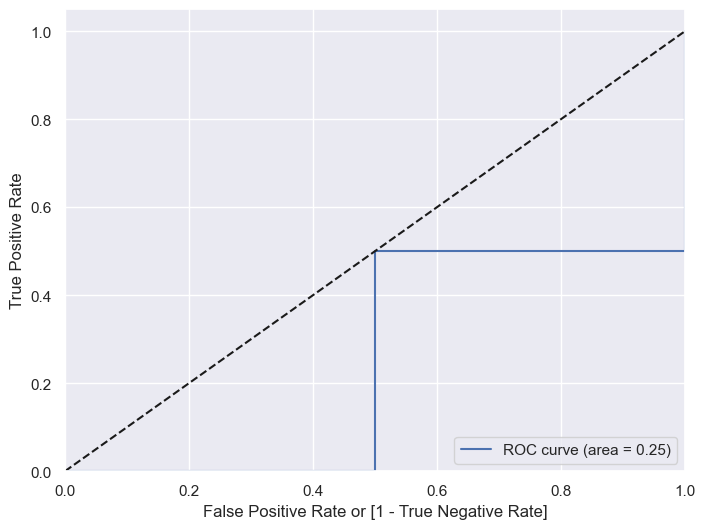

AUC Score: 0.25


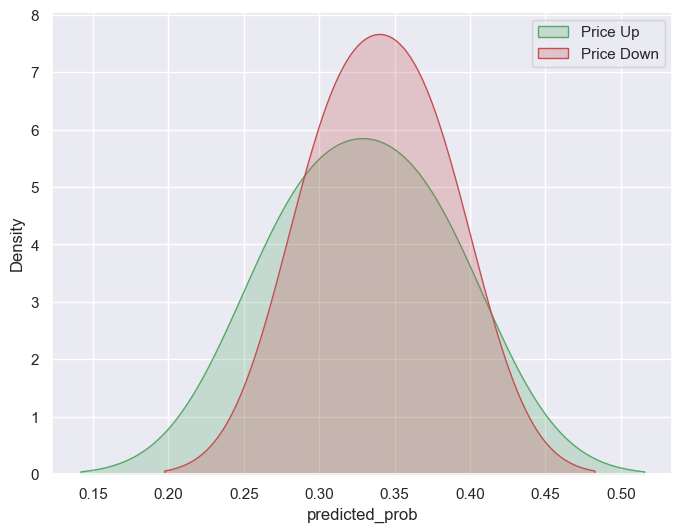

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       0.00      0.00      0.00         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4

Stock: MARICO.NS


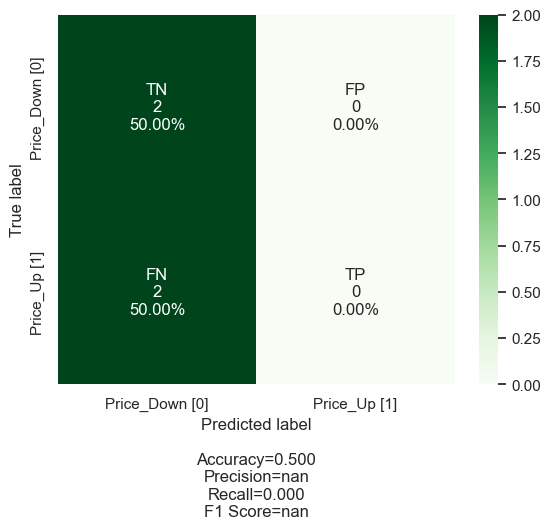

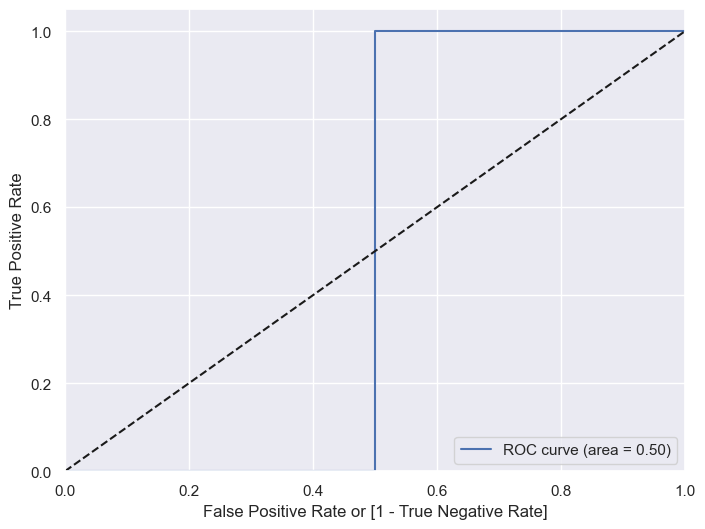

AUC Score: 0.5


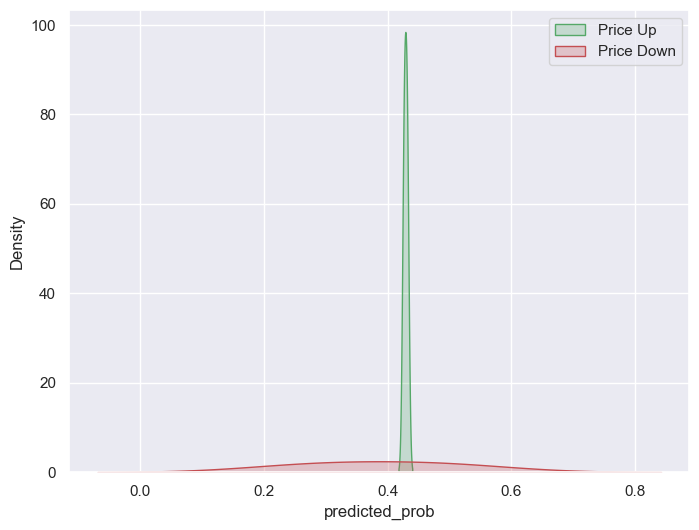

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       0.00      0.00      0.00         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4

Stock: SBIN.NS


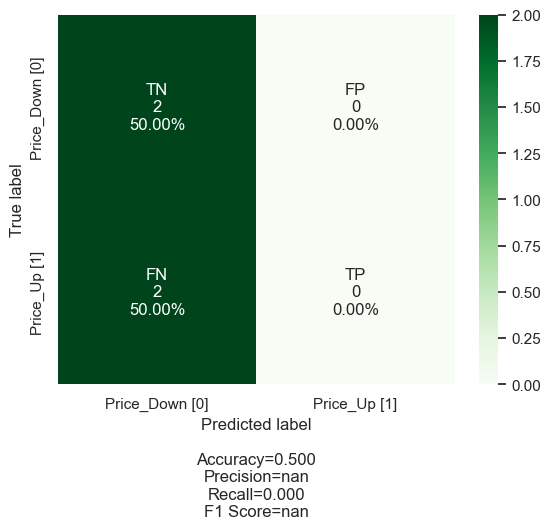

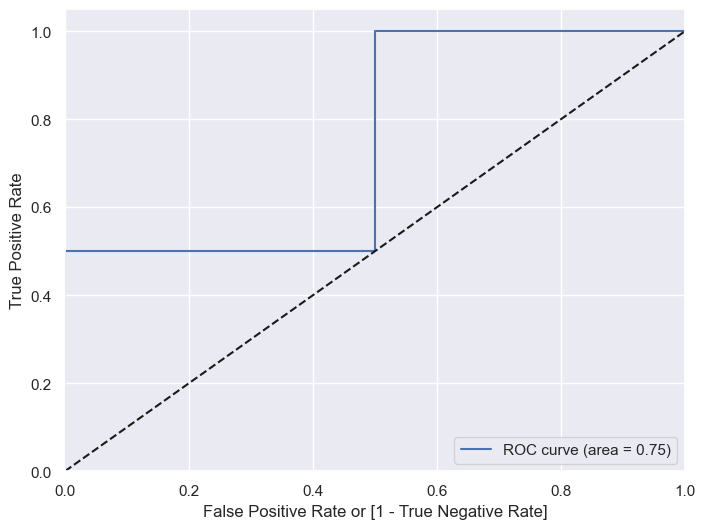

AUC Score: 0.75


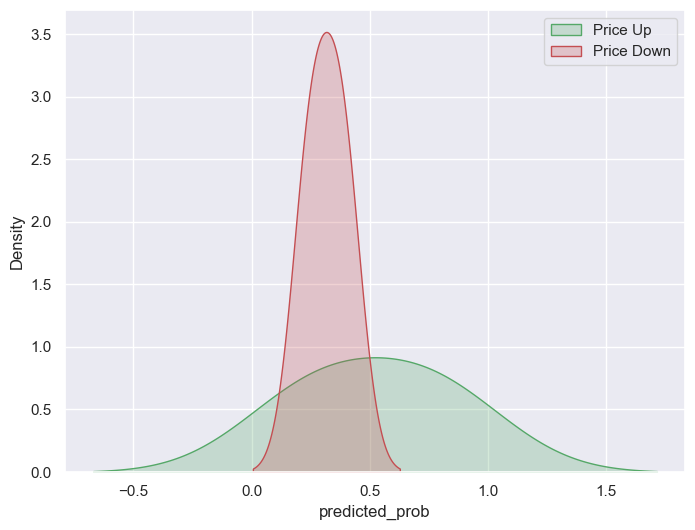

              precision    recall  f1-score   support

           0       0.67      1.00      0.80         2
           1       1.00      0.50      0.67         2

    accuracy                           0.75         4
   macro avg       0.83      0.75      0.73         4
weighted avg       0.83      0.75      0.73         4



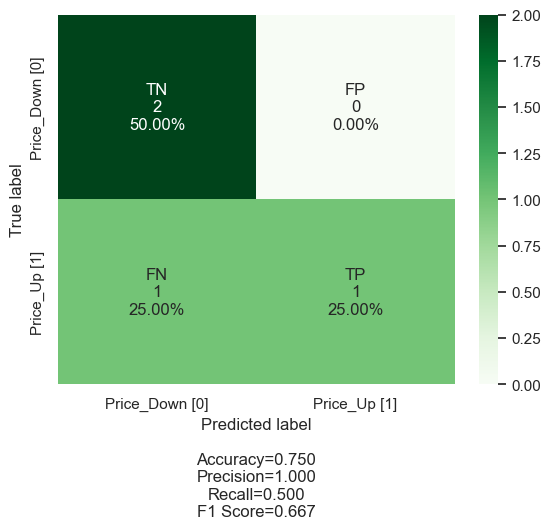

In [71]:
# Conduct Non-Linear SVM: Polynomial Kernel Classification for each ticker
for ticker in tickers:
    print(f"Stock: {ticker}")
    
    # Non-Linear SVM: Polynomial Kernel
    svc_nlinear_poly = SVC(kernel="poly", random_state=0, degree=2, C=100, probability=True)
    svc_nlinear_polymodel = svc_nlinear_poly.fit(X_train, y_train[ticker + '_Price_Up'])

    # Extracting Probabilities
    pred_prob = pd.DataFrame(svc_nlinear_polymodel.predict_proba(X_test))[1]
    actual = y_test[ticker + '_Price_Up'].to_numpy()
    y_pred_df = pd.DataFrame({"actual": actual, "predicted_prob": pred_prob})

    # Classifier Performance
    # Plotting AUC
    fpr, tpr, thresholds = draw_roc(y_pred_df.actual, y_pred_df.predicted_prob)

    # Measuring Test Accuracy
    auc_score = metrics.roc_auc_score(y_pred_df.actual, y_pred_df.predicted_prob)
    print(f"AUC Score: {auc_score}")

    # Plotting Distributions and Identifying optimal probability
    plt.figure(figsize=(8, 6))
    sn.kdeplot(y_pred_df[y_pred_df.actual == 1]["predicted_prob"], color='g', shade=True, label='Price Up')
    sn.kdeplot(y_pred_df[y_pred_df.actual == 0]["predicted_prob"], color='r', shade=True, label='Price Down')
    plt.legend()
    plt.show()

    # Confusion Matrix and Performance Measure
    y_pred_df['predicted'] = y_pred_df.predicted_prob.map(lambda x: 1 if x > 0.75 else 0)

    cf_matrix = metrics.confusion_matrix(y_pred_df.actual, y_pred_df.predicted)
    labels = ["TN", "FP", "FN", "TP"]
    categories = ["Price_Down [0]", "Price_Up [1]"]
    make_confusion_matrix(cf_matrix, group_names=labels, categories=categories, cmap="Greens")

    print(metrics.classification_report(y_pred_df.actual, y_pred_df.predicted))


Stock: BHARTIARTL.NS


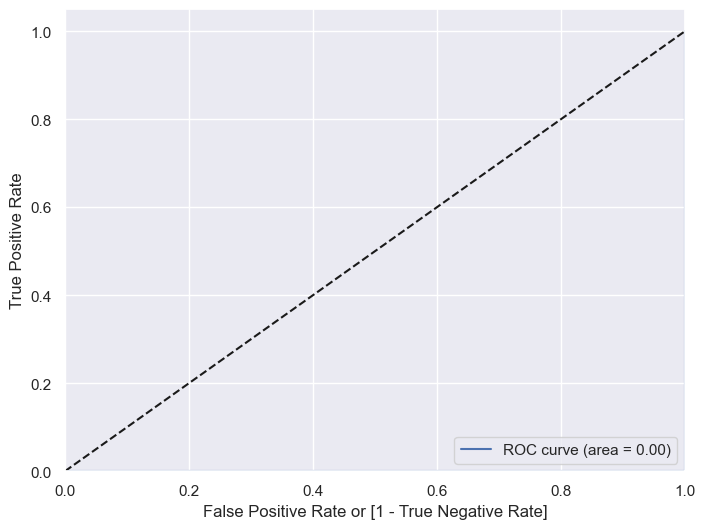

AUC Score: 0.0


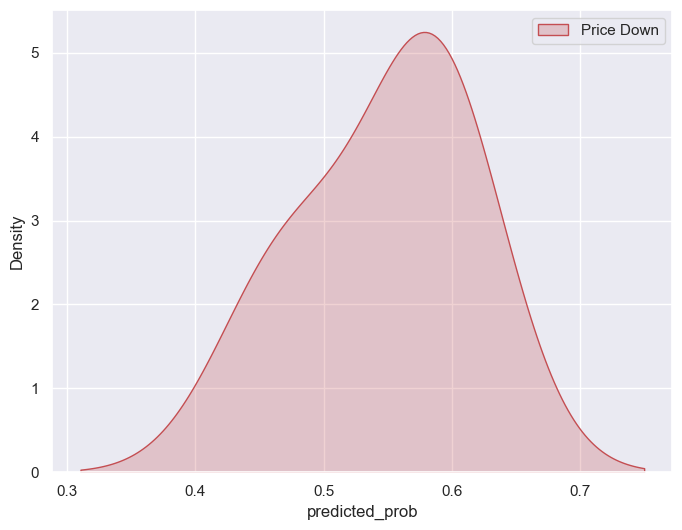

              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       0.00      0.00      0.00         1

    accuracy                           0.75         4
   macro avg       0.38      0.50      0.43         4
weighted avg       0.56      0.75      0.64         4

Stock: HFCL.NS


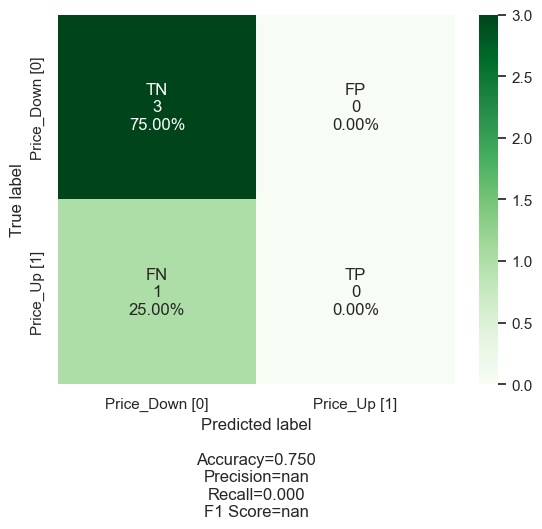

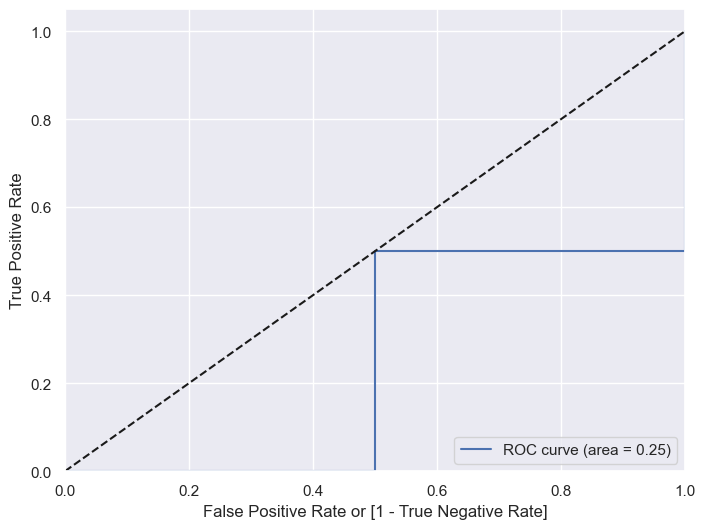

AUC Score: 0.25


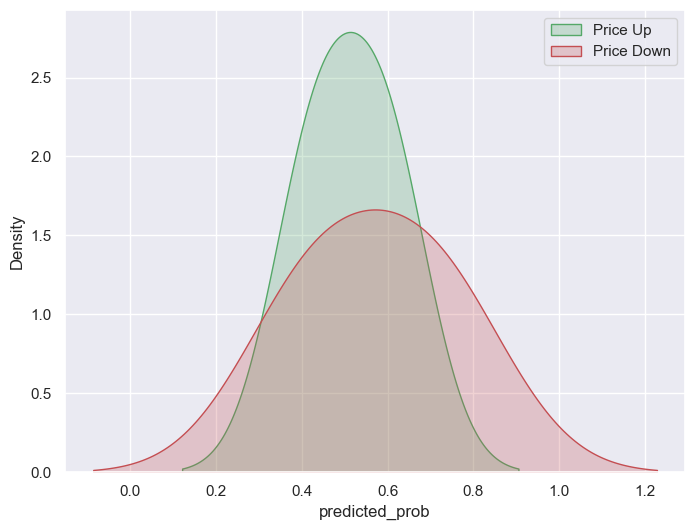

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       0.00      0.00      0.00         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4

Stock: MARICO.NS


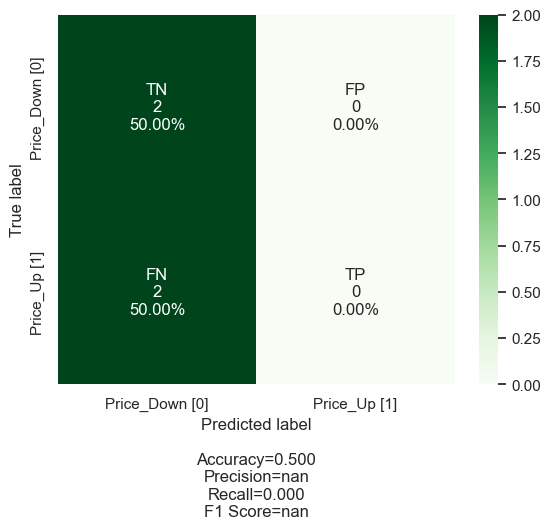

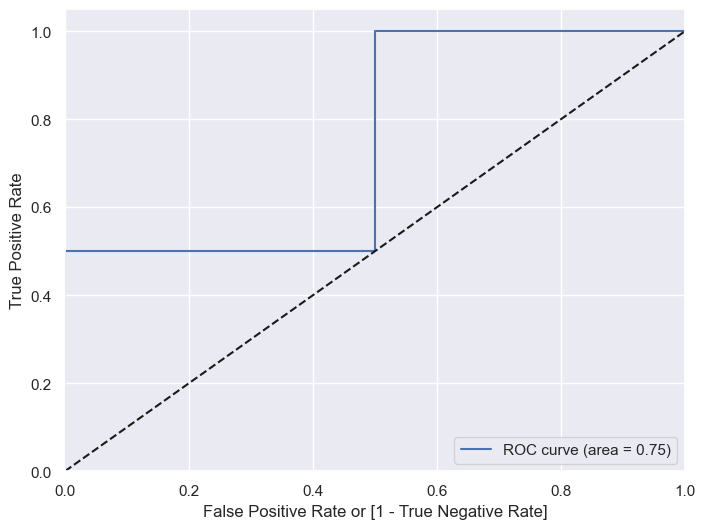

AUC Score: 0.75


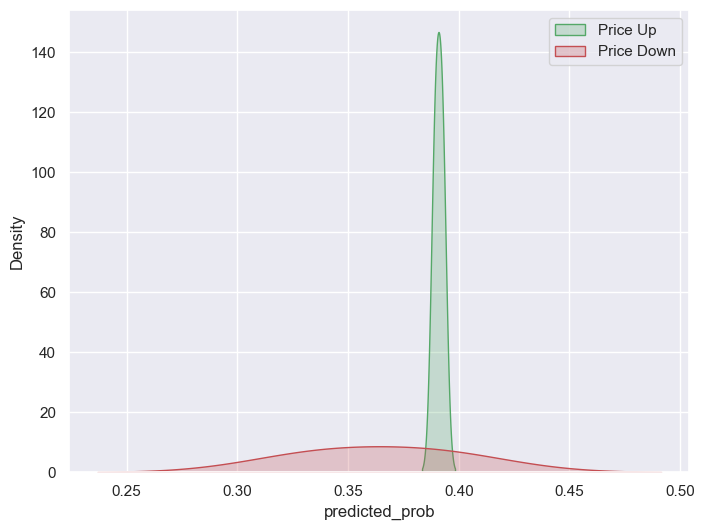

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         2
           1       0.00      0.00      0.00         2

    accuracy                           0.50         4
   macro avg       0.25      0.50      0.33         4
weighted avg       0.25      0.50      0.33         4

Stock: SBIN.NS


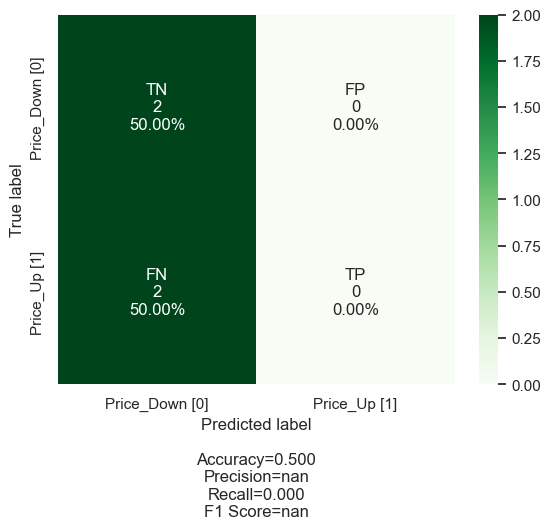

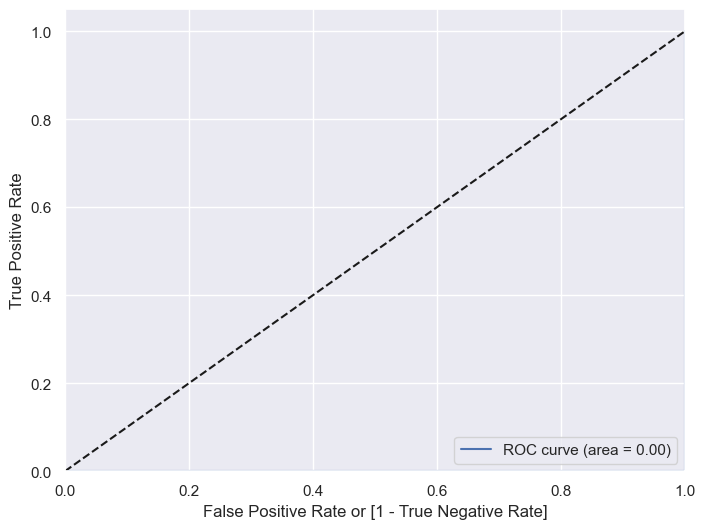

AUC Score: 0.0


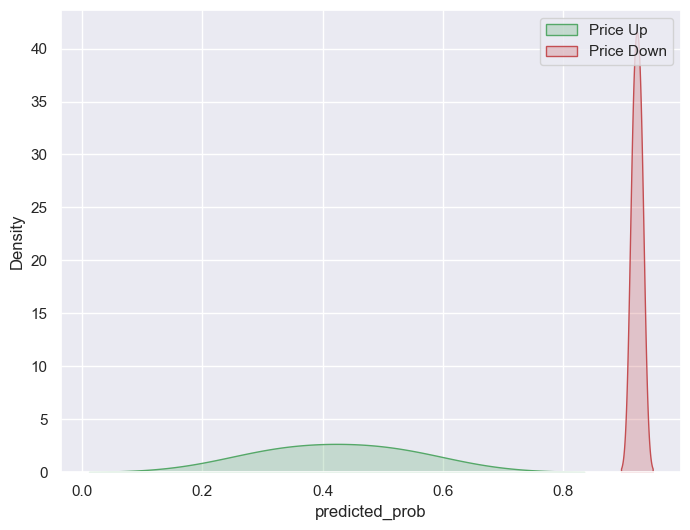

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       2.0
           1       0.00      0.00      0.00       2.0

    accuracy                           0.00       4.0
   macro avg       0.00      0.00      0.00       4.0
weighted avg       0.00      0.00      0.00       4.0



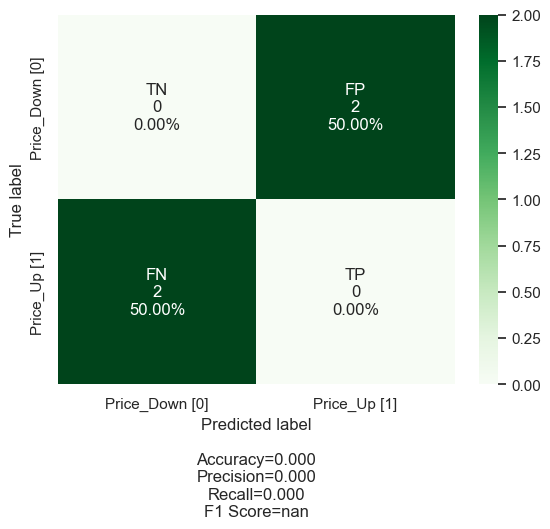

In [72]:
# Conduct Non-Linear SVM: Sigmoid Kernel Classification for each ticker
for ticker in tickers:
    print(f"Stock: {ticker}")
    
    # Non-Linear SVM: Sigmoid Kernel
    svc_nlinear_sig = SVC(kernel="sigmoid", random_state=0, C=1, probability=True)
    svc_nlinear_sigmodel = svc_nlinear_sig.fit(X_train, y_train[ticker + '_Price_Up'])

    # Extracting Probabilities
    pred_prob = pd.DataFrame(svc_nlinear_sigmodel.predict_proba(X_test))[1]
    actual = y_test[ticker + '_Price_Up'].to_numpy()
    y_pred_df = pd.DataFrame({"actual": actual, "predicted_prob": pred_prob})

    # Classifier Performance
    # Plotting AUC
    fpr, tpr, thresholds = draw_roc(y_pred_df.actual, y_pred_df.predicted_prob)

    # Measuring Test Accuracy
    auc_score = metrics.roc_auc_score(y_pred_df.actual, y_pred_df.predicted_prob)
    print(f"AUC Score: {auc_score}")

    # Plotting Distributions and Identifying optimal probability
    plt.figure(figsize=(8, 6))
    sn.kdeplot(y_pred_df[y_pred_df.actual == 1]["predicted_prob"], color='g', shade=True, label='Price Up')
    sn.kdeplot(y_pred_df[y_pred_df.actual == 0]["predicted_prob"], color='r', shade=True, label='Price Down')
    plt.legend()
    plt.show()

    # Confusion Matrix and Performance Measure
    y_pred_df['predicted'] = y_pred_df.predicted_prob.map(lambda x: 1 if x > 0.75 else 0)

    cf_matrix = metrics.confusion_matrix(y_pred_df.actual, y_pred_df.predicted)
    labels = ["TN", "FP", "FN", "TP"]
    categories = ["Price_Down [0]", "Price_Up [1]"]
    make_confusion_matrix(cf_matrix, group_names=labels, categories=categories, cmap="Greens")

    print(metrics.classification_report(y_pred_df.actual, y_pred_df.predicted))


In [73]:
# Evaluation of Classifier Performance
# Define the data for your DataFrame
summary_data = {
    'Stock': ['BHARTIARTL.NS', 'HFCL.NS', 'MARICO.NS', 'SBIN.NS'],
    'Price Up' : [7,7,7,6],
    'Price Down' : [5,5,5,6],
    'RBF Kernel_AUC': [0.00,0.25,0.00,0.00],
    'RBF Kernel_Accuracy': [0.5,0.5,0.5,0.5],
    'Poly Kernel_AUC': [1.00,0.25,0.5,0.5],
    'Poly Kernel_Accuracy': [0.75,0.5,0.5,0.75],
    'Sigmoid Kernel_AUC': [0.00,0.25,0.75,0.00],
    'Sigmoid Kernel_Accuracy': [0.75,0.5,0.5,0.00]
}

summary_df = pd.DataFrame(summary_data)
summary_df

# Based on the performance of the three models, it can be clearly inferred that The Polynomial Kernel Model of 
# SVM Classification tehcnique can be preferred to predict whether the price of a stock will go up or down.

,Stock,Price Up,Price Down,RBF Kernel_AUC,RBF Kernel_Accuracy,Poly Kernel_AUC,Poly Kernel_Accuracy,Sigmoid Kernel_AUC,Sigmoid Kernel_Accuracy
0,BHARTIARTL.NS,7,5,0.00,0.5,1.00,0.75,0.00,0.75
1,HFCL.NS,7,5,0.25,0.5,0.25,0.50,0.25,0.50
2,MARICO.NS,7,5,0.00,0.5,0.50,0.50,0.75,0.50
3,SBIN.NS,6,6,0.00,0.5,0.50,0.75,0.00,0.00


<h3 name='libraries'>   
      <font color = purple >
            <span style='font-family:Georgia'>
            Financial Analysis of our Portfolio
            </span>   
        </font>    
</h3>

In [30]:
tickers = ['BHARTIARTL.NS', 'HFCL.NS', 'MARICO.NS', 'SBIN.NS']
sel_sec_data = pd.DataFrame()

for t in tickers:
    data = yf.download(t, start='2008-09-01', end='2023-09-01',progress=False)
    sel_sec_data[t + '_Adj_Close'] = data['Adj Close']

sel_sec_data

,BHARTIARTL.NS_Adj_Close,HFCL.NS_Adj_Close,MARICO.NS_Adj_Close,SBIN.NS_Adj_Close
Date,,,,
2008-09-01,349.649506,14.876450,24.843027,118.933678
2008-09-02,357.553253,15.122749,24.780870,127.957069
2008-09-04,353.761993,14.974969,24.884466,128.940063
2008-09-05,344.166199,14.728669,24.490795,127.692390
2008-09-08,351.191742,15.172008,24.822309,133.733185
...,...,...,...,...
2023-08-25,873.500000,71.500000,560.200012,569.950012
2023-08-28,870.349976,71.449997,558.150024,572.849976
2023-08-29,855.200012,71.400002,562.500000,574.849976


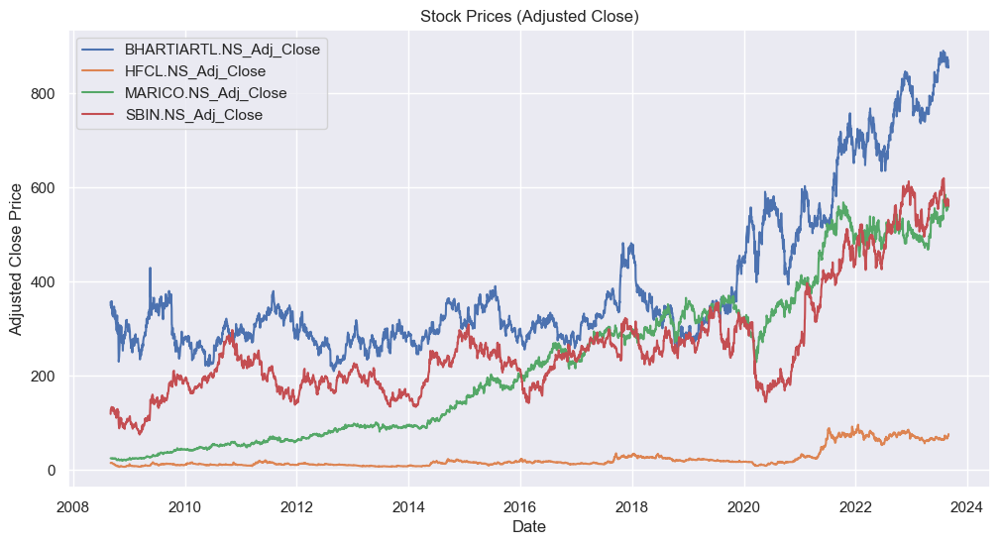

In [31]:
# Plot the Adjusted Closing Prices
plt.figure(figsize=(12, 6))
for column in sel_sec_data.columns:
    plt.plot(sel_sec_data.index, sel_sec_data[column], label=column)

plt.title('Stock Prices (Adjusted Close)')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [33]:
returns = np.log(sel_sec_data / sel_sec_data.shift(1))
returns

,BHARTIARTL.NS_Adj_Close,HFCL.NS_Adj_Close,MARICO.NS_Adj_Close,SBIN.NS_Adj_Close
Date,,,,
2008-09-01,NaN,NaN,NaN,NaN
2008-09-02,0.022353,0.016421,-0.002505,0.073129
2008-09-04,-0.010660,-0.009820,0.004172,0.007653
2008-09-05,-0.027500,-0.016584,-0.015946,-0.009724
2008-09-08,0.020208,0.029656,0.013445,0.046222
...,...,...,...,...
2023-08-25,0.004647,0.036316,-0.005873,-0.012207
2023-08-28,-0.003613,-0.000700,-0.003666,0.005075
2023-08-29,-0.017560,-0.000700,0.007763,0.003485


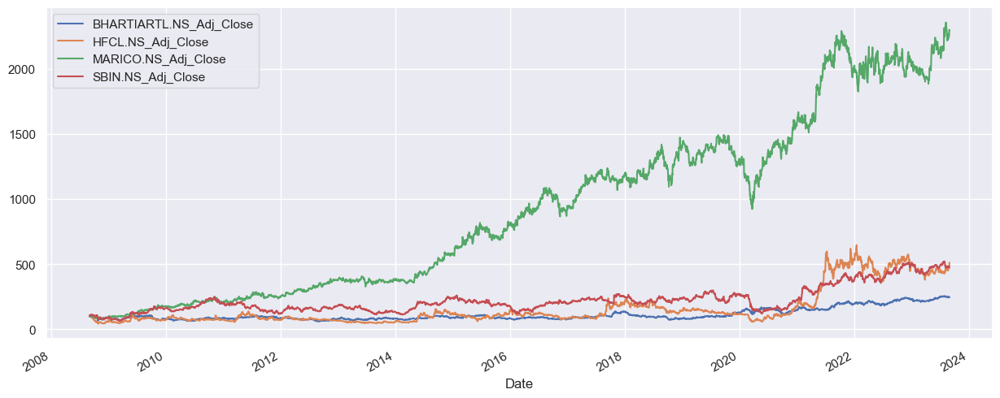

In [32]:
# Plot the Returns
(sel_sec_data / sel_sec_data.iloc[0]*100).plot(figsize = (15,6))
plt.show()

In [34]:
weights = np.array([0.25,0.10,0.40,0.25])
weights

array([0.25, 0.1 , 0.4 , 0.25])

In [35]:
annual_returns = returns.mean()*250
annual_returns

BHARTIARTL.NS_Adj_Close    0.060593
HFCL.NS_Adj_Close          0.110497
MARICO.NS_Adj_Close        0.211928
SBIN.NS_Adj_Close          0.104963
dtype: float64

In [36]:
# Expected Return %
np.dot(annual_returns,weights)
print(str(round(np.dot(annual_returns,weights),5)*100)+'%')

13.721%


In [37]:
annual_risk = round(returns.std()*250**0.5,5)*100
print(f'{annual_risk} %')

BHARTIARTL.NS_Adj_Close    33.913
HFCL.NS_Adj_Close          55.052
MARICO.NS_Adj_Close        27.069
SBIN.NS_Adj_Close          35.624
dtype: float64 %


In [38]:
# Portfolio Volatility
pfolio_var = np.dot(weights.T,np.dot(returns.cov()*250,weights))
pfolio_vol = np.sqrt(pfolio_var)
print(str(round(pfolio_vol,5)*100)+'%')

21.804000000000002%


In [39]:
returns.cov()*250

,BHARTIARTL.NS_Adj_Close,HFCL.NS_Adj_Close,MARICO.NS_Adj_Close,SBIN.NS_Adj_Close
BHARTIARTL.NS_Adj_Close,0.115010,0.033632,0.015306,0.040148
HFCL.NS_Adj_Close,0.033632,0.303076,0.023176,0.059716
MARICO.NS_Adj_Close,0.015306,0.023176,0.073275,0.015321
SBIN.NS_Adj_Close,0.040148,0.059716,0.015321,0.126908


In [40]:
returns.corr()

,BHARTIARTL.NS_Adj_Close,HFCL.NS_Adj_Close,MARICO.NS_Adj_Close,SBIN.NS_Adj_Close
BHARTIARTL.NS_Adj_Close,1.000000,0.180141,0.166733,0.332320
HFCL.NS_Adj_Close,0.180141,1.000000,0.155521,0.304489
MARICO.NS_Adj_Close,0.166733,0.155521,1.000000,0.158875
SBIN.NS_Adj_Close,0.332320,0.304489,0.158875,1.000000


In [41]:
# Diversifiable Risk
dr = pfolio_var - (weights[0]**2 * returns['BHARTIARTL.NS_Adj_Close'].var()*250) - (weights[1]**2 * returns['HFCL.NS_Adj_Close'].var()*250) - (weights[2]**2 * returns['MARICO.NS_Adj_Close'].var()*250) - (weights[3]**2 * returns['SBIN.NS_Adj_Close'].var()*250) 
# Non-Diversifiable Risk
n_dr = pfolio_var - dr

print('Diversifiable Risk: ' + str(round(dr*100,2)) + '%')
print('Non- Diversifiable Risk: ' +str(round(n_dr*100,2)) + '%')

Diversifiable Risk: 1.77%
Non- Diversifiable Risk: 2.99%


In [42]:
tickers = ['BHARTIARTL.NS', 'HFCL.NS', 'MARICO.NS', 'SBIN.NS','^NSEI']
mar_sel_sec_data = pd.DataFrame()

for t in tickers:
    data = yf.download(t, start='2008-09-01', end='2023-09-01',progress=False)
    mar_sel_sec_data[t + '_Adj_Close'] = data['Adj Close']

sec_returns = np.log(mar_sel_sec_data/mar_sel_sec_data.shift(1))
sec_returns

,BHARTIARTL.NS_Adj_Close,HFCL.NS_Adj_Close,MARICO.NS_Adj_Close,SBIN.NS_Adj_Close,^NSEI_Adj_Close
Date,,,,,
2008-09-01,NaN,NaN,NaN,NaN,NaN
2008-09-02,0.022353,0.016421,-0.002505,0.073129,0.035100
2008-09-04,-0.010660,-0.009820,0.004172,0.007653,-0.012568
2008-09-05,-0.027500,-0.016584,-0.015946,-0.009724,-0.021694
2008-09-08,0.020208,0.029656,0.013445,0.046223,0.029432
...,...,...,...,...,...
2023-08-25,0.004647,0.036316,-0.005873,-0.012207,-0.006256
2023-08-28,-0.003613,-0.000700,-0.003666,0.005075,0.002087
2023-08-29,-0.017560,-0.000700,0.007763,0.003485,0.001894


In [43]:
cov = sec_returns.cov()*250
cov

,BHARTIARTL.NS_Adj_Close,HFCL.NS_Adj_Close,MARICO.NS_Adj_Close,SBIN.NS_Adj_Close,^NSEI_Adj_Close
BHARTIARTL.NS_Adj_Close,0.115010,0.033632,0.015306,0.040148,0.035573
HFCL.NS_Adj_Close,0.033632,0.303076,0.023176,0.059716,0.041800
MARICO.NS_Adj_Close,0.015306,0.023176,0.073275,0.015321,0.016372
SBIN.NS_Adj_Close,0.040148,0.059716,0.015321,0.126908,0.050065
^NSEI_Adj_Close,0.035573,0.041800,0.016372,0.050065,0.041080


In [44]:
market_var = sec_returns['^NSEI_Adj_Close'].var()*250

cov_with_market1 = cov.iloc[0,4]
cov_with_market2 = cov.iloc[1,4]
cov_with_market3 = cov.iloc[2,4]
cov_with_market4 = cov.iloc[3,4]

In [45]:
beta1 = cov_with_market1 / market_var
beta2 = cov_with_market2 / market_var
beta3 = cov_with_market3 / market_var
beta4 = cov_with_market4 / market_var

print(f'The Beta value of Bharti Airtel is: {beta1}')
print(f'The Beta value of HFCL is: {beta2}')
print(f'The Beta value of Marico is: {beta3}')
print(f'The Beta value of SBI is: {beta4}')

The Beta value of Bharti Airtel is: 0.8659285460077591
The Beta value of HFCL is: 1.0175213945160066
The Beta value of Marico is: 0.39853351969564554
The Beta value of SBI is: 1.2187082422902862


<div class="alert alert-block alert-info">
    <span style='font-family:Garamound'>
        <ul>
            <li>As of June 30, 2023, the 10-year G-Sec Par Yield (FBIL) in India is 7.07% (Source: https://www.rbi.org.in/Scripts/BS_NSDPDisplay.aspx?param=4)</li>
            <li> According to independent valuation services, the recommended ERP for India in 2023 is 7.50%, with a range of 7.00% to 8.00% (Source: https://incwert.com/india-equity-risk-premium-2023/) </li>
        </ul>
    </span> 
</div>

In [46]:
rf = 0.0707
rm = 0.075
er1 = round((rf + beta1 * rm),5)*100
er2 = round((rf + beta2 * rm),5)*100
er3 = round((rf + beta3 * rm),5)*100
er4 = round((rf + beta4 * rm),5)*100

print('Using CAPM:')
print(f'The expected return of Bharti Airtel is: {er1}%')
print(f'The expected return of HFCL is: {er2}%')
print(f'The expected return of Marico is: {er3}%')
print(f'The expected return of SBI is: {er4}%')

Using CAPM:
The expected return of Bharti Airtel is: 13.564000000000002%
The expected return of HFCL is: 14.701%
The expected return of Marico is: 10.059%
The expected return of SBI is: 16.21%


In [47]:
Sharpe1 = ((rf + beta1 * rm) - rf) / (sec_returns['BHARTIARTL.NS_Adj_Close'].std()*250 ** 0.5)
Sharpe2 = ((rf + beta2 * rm) - rf) / (sec_returns['HFCL.NS_Adj_Close'].std()*250 ** 0.5)
Sharpe3 = ((rf + beta3 * rm) - rf) / (sec_returns['MARICO.NS_Adj_Close'].std()*250 ** 0.5)
Sharpe4 = ((rf + beta4 * rm) - rf) / (sec_returns['SBIN.NS_Adj_Close'].std()*250 ** 0.5)

print('Using Sharpe Ratio:')
print(f'The risk-adjusted return of Bharti Airtel is: {Sharpe1}')
print(f'The risk-adjusted return of HFCL is: {Sharpe2}')
print(f'The risk-adjusted return of Marico is: {Sharpe3}')
print(f'The risk-adjusted return of SBI is: {Sharpe4}')

Using Sharpe Ratio:
The risk-adjusted return of Bharti Airtel is: 0.1915032834031272
The risk-adjusted return of HFCL is: 0.1386209570505685
The risk-adjusted return of Marico is: 0.1104204124330078
The risk-adjusted return of SBI is: 0.2565761151291757
